In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, Conv1D, MaxPooling1D, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot
    
# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for specific humidity
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for specific humidity
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for specific humidity
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    agg.columns = names

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)

    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    #diff_values_training = np.array(diff_values_for_training)
    #diff_values_training = diff_values_training.reshape(1, -1) 
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (specific_humidity) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)

    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 6
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')

# Swap columns 'temperatures' and 'specific_humidity' directly
df['A'] = df['temperatures']
df['temperatures'] = df['specific_humidity']
df['specific_humidity'] = df['A']
df = df.drop(columns=['A'])
# Rename columns
df = df.rename(columns={'temperatures': 'specific_humidity', 'specific_humidity': 'temperatures'})

print(df)
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)

#Test model and accuracy when ONI is removed as a predictor
df_trimmed = df_trimmed.drop(['ONI'], axis=1)

n_vars = df_trimmed.shape[1]-1

X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['specific_humidity'].iloc[j])
    y.append(add_to_y)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df) 
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['specific_humidity']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df)

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['specific_humidity']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + n_vars*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
print("Finished")

Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 6
C:\Users\User
C:\Users\User\Modeling\
             date  file_id  specific_humidity          slp  vapor_pressure  \
0      2006-01-31     6501           5.386935  1018.534543        8.674922   
1      2006-02-28     6501           4.299929  1021.230347        6.942276   
2      2006-03-31     6501           6.505135  1018.968548       10.468176   
3      2006-04-30     6501          10.211263  1014.686944       16.358802   
4      2006-05-31     6501          11.737971  1014.236828       18.798749   
...           ...      ...                ...          ...             ...   
24057  2024-07-31     9858          15.211417  1013.969355       23.769169   
24058  2024-08-31     9858          15.149811  1015.112097       23.699154   
24059  2024-09-30     9858          10.720199  1014.393750       16.790240   
24060  2024-10-31     9858           6.989922  1018.230376       10

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

6
179
(84, 1975)
(11, 1975)


In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit a CNN-LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    filters = trial.suggest_categorical('filters', [256, 512, 1024]) # Used for CNN-LSTM model
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM Only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "CNN-LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

# Make one forecast with a CNN-LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_cnnlstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_cnnlstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # Create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# Evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Specific Humidity")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100

# Optimize and fit the model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)
    
rmse_avg_list = []
mae_avg_list = []
mape_avg_list = []
r2_score_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (specific humidity)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction

    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse_avg_list.append(rmse_list)
    mae_avg_list.append(mae_list)
    mape_avg_list.append(mape_list)
    r2_score_avg_list.append(r2_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)

    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual S.H.\tPredicted S.H.\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        
        plot_forecasts(series_ws, forecasts_ws, n_test, n_seq, n_lag)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)
            
        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='CNN-LSTM Model Comparison Specific Humidity Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No ONI)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Specific Humidity')
        plt.legend()
        plt.show()

    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'CNN-LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No ONI)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse_avg_list)
print(mae_avg_list)
print(mape_avg_list)
print(r2_score_avg_list)
print(forecast_results)
print(actual_results)
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse_avg_list)
print("Average RMSE:"+str(np.mean(rmse_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "cnnlstm_model_optimized_SH_S12_No_ONI.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)

[I 2025-05-27 02:19:43,450] A new study created in memory with name: no-name-119454d0-9a54-40a3-83da-657d34bf1c56
[I 2025-05-27 02:26:26,806] Trial 0 finished with value: 0.05959556996822357 and parameters: {'lr': 0.01940380147730678, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.136179446886255}. Best is trial 0 with value: 0.05959556996822357.


Cross Validation Accuracies:
[0.05734885111451149, 0.04724409803748131, 0.07313306629657745, 0.06151841580867767, 0.058733418583869934]
Mean Cross Validation Accuracy:
0.05959556996822357
Standard Deviation of Cross Validation Accuracy:
0.008310367650584766


[I 2025-05-27 02:31:36,794] Trial 1 finished with value: 0.052119769155979156 and parameters: {'lr': 0.013797705506939758, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.24035057627007972}. Best is trial 1 with value: 0.052119769155979156.


Cross Validation Accuracies:
[0.03841353952884674, 0.052358660846948624, 0.061122599989175797, 0.062383607029914856, 0.046320438385009766]
Mean Cross Validation Accuracy:
0.052119769155979156
Standard Deviation of Cross Validation Accuracy:
0.009032689169194322


[I 2025-05-27 02:36:34,545] Trial 2 finished with value: 0.30381635427474973 and parameters: {'lr': 0.002522450229948301, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.37671966644924504}. Best is trial 1 with value: 0.052119769155979156.


Cross Validation Accuracies:
[0.3011288344860077, 0.330750972032547, 0.31187495589256287, 0.2788380980491638, 0.2964889109134674]
Mean Cross Validation Accuracy:
0.30381635427474973
Standard Deviation of Cross Validation Accuracy:
0.01717697392844252


[I 2025-05-27 02:41:19,136] Trial 3 finished with value: 0.05390450954437256 and parameters: {'lr': 0.2637210499820346, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.36939340204249893}. Best is trial 1 with value: 0.052119769155979156.


Cross Validation Accuracies:
[0.035215090960264206, 0.050707004964351654, 0.06320903450250626, 0.062452517449855804, 0.05793889984488487]
Mean Cross Validation Accuracy:
0.05390450954437256
Standard Deviation of Cross Validation Accuracy:
0.010348307412295733


[I 2025-05-27 02:46:03,948] Trial 4 finished with value: 0.06044033020734787 and parameters: {'lr': 0.006254802778890543, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.4641130316206483}. Best is trial 1 with value: 0.052119769155979156.


Cross Validation Accuracies:
[0.03988248109817505, 0.07281319797039032, 0.06562133878469467, 0.07018613815307617, 0.05369849503040314]
Mean Cross Validation Accuracy:
0.06044033020734787
Standard Deviation of Cross Validation Accuracy:
0.012190069570137033


[I 2025-05-27 02:51:52,710] Trial 5 finished with value: 0.3837651550769806 and parameters: {'lr': 0.06771048516200502, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.37999677868322534}. Best is trial 1 with value: 0.052119769155979156.


Cross Validation Accuracies:
[0.5927703380584717, 0.36593037843704224, 0.38919925689697266, 0.22306793928146362, 0.34785786271095276]
Mean Cross Validation Accuracy:
0.3837651550769806
Standard Deviation of Cross Validation Accuracy:
0.11928428567334715


[I 2025-05-27 02:57:21,310] Trial 6 finished with value: 0.07959217429161072 and parameters: {'lr': 0.003748580901734088, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.25160816348155557}. Best is trial 1 with value: 0.052119769155979156.


Cross Validation Accuracies:
[0.0963670089840889, 0.0875147134065628, 0.06668116897344589, 0.07734213769435883, 0.07005584239959717]
Mean Cross Validation Accuracy:
0.07959217429161072
Standard Deviation of Cross Validation Accuracy:
0.011016896604372788


[I 2025-05-27 03:02:16,339] Trial 7 finished with value: 0.07831294611096382 and parameters: {'lr': 0.88665211929306, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.40181554302382483}. Best is trial 1 with value: 0.052119769155979156.


Cross Validation Accuracies:
[0.04572248086333275, 0.09999119490385056, 0.08404464274644852, 0.07947894185781479, 0.0823274701833725]
Mean Cross Validation Accuracy:
0.07831294611096382
Standard Deviation of Cross Validation Accuracy:
0.017789958919088


[I 2025-05-27 03:09:50,893] Trial 8 finished with value: 0.05503253862261772 and parameters: {'lr': 0.054465203561444964, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.25600292451259676}. Best is trial 1 with value: 0.052119769155979156.


Cross Validation Accuracies:
[0.04123888537287712, 0.052622999995946884, 0.06659913063049316, 0.06481539458036423, 0.04988628253340721]
Mean Cross Validation Accuracy:
0.05503253862261772
Standard Deviation of Cross Validation Accuracy:
0.009508364943247591


[I 2025-05-27 03:14:18,206] Trial 9 finished with value: 0.052834860235452655 and parameters: {'lr': 0.011975942186884567, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.39984319872915375}. Best is trial 1 with value: 0.052119769155979156.


Cross Validation Accuracies:
[0.04246103763580322, 0.049565624445676804, 0.06159947067499161, 0.06160039082169533, 0.0489477775990963]
Mean Cross Validation Accuracy:
0.052834860235452655
Standard Deviation of Cross Validation Accuracy:
0.007577155561491961


[I 2025-05-27 03:19:40,605] Trial 10 finished with value: 0.20076853632926941 and parameters: {'lr': 0.0011046672831994731, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.16387020008354777}. Best is trial 1 with value: 0.052119769155979156.


Cross Validation Accuracies:
[0.21391163766384125, 0.23492537438869476, 0.19434499740600586, 0.1942664533853531, 0.1663942188024521]
Mean Cross Validation Accuracy:
0.20076853632926941
Standard Deviation of Cross Validation Accuracy:
0.022823511295378466


[I 2025-05-27 03:24:48,467] Trial 11 finished with value: 0.05195319652557373 and parameters: {'lr': 0.015584020427857819, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.2922818828112487}. Best is trial 11 with value: 0.05195319652557373.


Cross Validation Accuracies:
[0.038066789507865906, 0.05130888521671295, 0.06066237762570381, 0.06036940962076187, 0.04935852065682411]
Mean Cross Validation Accuracy:
0.05195319652557373
Standard Deviation of Cross Validation Accuracy:
0.008326611052361241


[I 2025-05-27 03:29:01,642] Trial 12 finished with value: 0.05197460278868675 and parameters: {'lr': 0.03062146888575722, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.21859454332519396}. Best is trial 11 with value: 0.05195319652557373.


Cross Validation Accuracies:
[0.03783451020717621, 0.05149403586983681, 0.05903623253107071, 0.06429034471511841, 0.04721789062023163]
Mean Cross Validation Accuracy:
0.05197460278868675
Standard Deviation of Cross Validation Accuracy:
0.009212421910091827


[I 2025-05-27 03:34:07,834] Trial 13 finished with value: 0.06744850724935532 and parameters: {'lr': 0.13233010693487424, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.19133724632604399}. Best is trial 11 with value: 0.05195319652557373.


Cross Validation Accuracies:
[0.07829795032739639, 0.05403037369251251, 0.07475384324789047, 0.06981077045202255, 0.06034959852695465]
Mean Cross Validation Accuracy:
0.06744850724935532
Standard Deviation of Cross Validation Accuracy:
0.009023297066949197


[I 2025-05-27 03:39:41,887] Trial 14 finished with value: 0.11628285497426986 and parameters: {'lr': 0.037097263537045136, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.3129392842130956}. Best is trial 11 with value: 0.05195319652557373.


Cross Validation Accuracies:
[0.10761284828186035, 0.1193338930606842, 0.11715476959943771, 0.13576246798038483, 0.10155029594898224]
Mean Cross Validation Accuracy:
0.11628285497426986
Standard Deviation of Cross Validation Accuracy:
0.01167682921744037


[I 2025-05-27 03:44:54,331] Trial 15 finished with value: 17.12307357788086 and parameters: {'lr': 0.18527654994045417, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.10264994142871849}. Best is trial 11 with value: 0.05195319652557373.


Cross Validation Accuracies:
[21.932052612304688, 15.646483421325684, 13.103899955749512, 18.634342193603516, 16.2985897064209]
Mean Cross Validation Accuracy:
17.12307357788086
Standard Deviation of Cross Validation Accuracy:
2.9807402077995953


[I 2025-05-27 03:51:54,053] Trial 16 finished with value: 0.05267215445637703 and parameters: {'lr': 0.00796434713784069, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.3115941978299201}. Best is trial 11 with value: 0.05195319652557373.


Cross Validation Accuracies:
[0.04110317304730415, 0.0494789220392704, 0.062358416616916656, 0.06419768929481506, 0.04622257128357887]
Mean Cross Validation Accuracy:
0.05267215445637703
Standard Deviation of Cross Validation Accuracy:
0.009080713795409767


[I 2025-05-27 03:57:00,859] Trial 17 finished with value: 0.05132675245404243 and parameters: {'lr': 0.026012709243219356, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.21596686256249392}. Best is trial 17 with value: 0.05132675245404243.


Cross Validation Accuracies:
[0.037711746990680695, 0.04920114576816559, 0.06190795078873634, 0.06104901805520058, 0.04676390066742897]
Mean Cross Validation Accuracy:
0.05132675245404243
Standard Deviation of Cross Validation Accuracy:
0.009134444707748886


[I 2025-05-27 04:01:29,236] Trial 18 finished with value: 0.32294864058494566 and parameters: {'lr': 0.0854369149681356, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.28379684926559773}. Best is trial 17 with value: 0.05132675245404243.


Cross Validation Accuracies:
[0.24262666702270508, 0.23945297300815582, 0.22890542447566986, 0.2724335491657257, 0.6313245892524719]
Mean Cross Validation Accuracy:
0.32294864058494566
Standard Deviation of Cross Validation Accuracy:
0.1548643100361681


[I 2025-05-27 04:07:24,316] Trial 19 finished with value: 1.615579080581665 and parameters: {'lr': 0.021040773448103123, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.20022390034519272}. Best is trial 17 with value: 0.05132675245404243.


Cross Validation Accuracies:
[1.3053301572799683, 1.7430014610290527, 1.877912163734436, 1.3382067680358887, 1.8134448528289795]
Mean Cross Validation Accuracy:
1.615579080581665
Standard Deviation of Cross Validation Accuracy:
0.24388348347487476


[I 2025-05-27 04:13:31,016] Trial 20 finished with value: 0.06279066503047943 and parameters: {'lr': 0.4507619606964981, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.4713336767775088}. Best is trial 17 with value: 0.05132675245404243.


Cross Validation Accuracies:
[0.0737050399184227, 0.046626146882772446, 0.06233089789748192, 0.07396174967288971, 0.05732949078083038]
Mean Cross Validation Accuracy:
0.06279066503047943
Standard Deviation of Cross Validation Accuracy:
0.010346440626917301


[I 2025-05-27 04:18:08,604] Trial 21 finished with value: 0.05185424610972404 and parameters: {'lr': 0.028014032373996453, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.21145851773868712}. Best is trial 17 with value: 0.05132675245404243.


Cross Validation Accuracies:
[0.039146244525909424, 0.05419284477829933, 0.0604635514318943, 0.05887546390295029, 0.04659312590956688]
Mean Cross Validation Accuracy:
0.05185424610972404
Standard Deviation of Cross Validation Accuracy:
0.007975705250041086


[I 2025-05-27 04:22:37,298] Trial 22 finished with value: 0.05049375742673874 and parameters: {'lr': 0.032640749526795416, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.27889799963211287}. Best is trial 22 with value: 0.05049375742673874.


Cross Validation Accuracies:
[0.03460276126861572, 0.048014961183071136, 0.05891325697302818, 0.060889776796102524, 0.05004803091287613]
Mean Cross Validation Accuracy:
0.05049375742673874
Standard Deviation of Cross Validation Accuracy:
0.009357692591428898


[I 2025-05-27 04:26:58,729] Trial 23 finished with value: 0.05069147720932961 and parameters: {'lr': 0.03919045812623117, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.17571470476288553}. Best is trial 22 with value: 0.05049375742673874.


Cross Validation Accuracies:
[0.04519824683666229, 0.04680955782532692, 0.05813935771584511, 0.057980045676231384, 0.04533017799258232]
Mean Cross Validation Accuracy:
0.05069147720932961
Standard Deviation of Cross Validation Accuracy:
0.006042889402572813


[I 2025-05-27 04:32:03,616] Trial 24 finished with value: 0.051805978268384935 and parameters: {'lr': 0.04675091495580567, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.16588926183576547}. Best is trial 22 with value: 0.05049375742673874.


Cross Validation Accuracies:
[0.04713021591305733, 0.04899437725543976, 0.06079735979437828, 0.05796360969543457, 0.04414432868361473]
Mean Cross Validation Accuracy:
0.051805978268384935
Standard Deviation of Cross Validation Accuracy:
0.006437858258095876


[I 2025-05-27 04:36:18,420] Trial 25 finished with value: 0.10827268362045288 and parameters: {'lr': 0.10349249684310716, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.1303945485604232}. Best is trial 22 with value: 0.05049375742673874.


Cross Validation Accuracies:
[0.08442935347557068, 0.11047602444887161, 0.10574927926063538, 0.12567536532878876, 0.11503339558839798]
Mean Cross Validation Accuracy:
0.10827268362045288
Standard Deviation of Cross Validation Accuracy:
0.013625617268383369


[I 2025-05-27 04:40:23,989] Trial 26 finished with value: 0.05249616503715515 and parameters: {'lr': 0.008357344443674824, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.17821998915617343}. Best is trial 22 with value: 0.05049375742673874.


Cross Validation Accuracies:
[0.040154531598091125, 0.050516411662101746, 0.06181131675839424, 0.06145477667450905, 0.048543788492679596]
Mean Cross Validation Accuracy:
0.05249616503715515
Standard Deviation of Cross Validation Accuracy:
0.008232683569507763


[I 2025-05-27 04:44:41,189] Trial 27 finished with value: 0.287900248169899 and parameters: {'lr': 0.04762528461544721, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.2738551568241512}. Best is trial 22 with value: 0.05049375742673874.


Cross Validation Accuracies:
[0.2635827362537384, 0.2426276057958603, 0.40434730052948, 0.19872012734413147, 0.3302234709262848]
Mean Cross Validation Accuracy:
0.287900248169899
Standard Deviation of Cross Validation Accuracy:
0.07203501741728166


[I 2025-05-27 04:52:05,320] Trial 28 finished with value: 0.289948445558548 and parameters: {'lr': 0.0046055100892447905, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.3285936999108247}. Best is trial 22 with value: 0.05049375742673874.


Cross Validation Accuracies:
[0.3046385943889618, 0.32181552052497864, 0.27654755115509033, 0.2554311156272888, 0.2913094460964203]
Mean Cross Validation Accuracy:
0.289948445558548
Standard Deviation of Cross Validation Accuracy:
0.022821889923649752


[I 2025-05-27 04:56:48,379] Trial 29 finished with value: 0.08492109179496765 and parameters: {'lr': 0.026173769975998632, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.1438012024799974}. Best is trial 22 with value: 0.05049375742673874.


Cross Validation Accuracies:
[0.07315808534622192, 0.07479474693536758, 0.09890840202569962, 0.09120047092437744, 0.08654375374317169]
Mean Cross Validation Accuracy:
0.08492109179496765
Standard Deviation of Cross Validation Accuracy:
0.009783860817372024


[I 2025-05-27 05:01:57,317] Trial 30 finished with value: 0.9193730115890503 and parameters: {'lr': 0.15162364162809164, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.2314544025538811}. Best is trial 22 with value: 0.05049375742673874.


Cross Validation Accuracies:
[0.7975788116455078, 0.6960082054138184, 0.6312322020530701, 1.5185412168502808, 0.9535046219825745]
Mean Cross Validation Accuracy:
0.9193730115890503
Standard Deviation of Cross Validation Accuracy:
0.3187219148165547


[I 2025-05-27 05:06:13,408] Trial 31 finished with value: 0.048382581770420076 and parameters: {'lr': 0.041705405422317626, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.1557921969045022}. Best is trial 31 with value: 0.048382581770420076.


Cross Validation Accuracies:
[0.03165258467197418, 0.04699040949344635, 0.061083994805812836, 0.053511716425418854, 0.04867420345544815]
Mean Cross Validation Accuracy:
0.048382581770420076
Standard Deviation of Cross Validation Accuracy:
0.00969071622920324


[I 2025-05-27 05:10:45,275] Trial 32 finished with value: 0.05163274183869362 and parameters: {'lr': 0.018063952596211307, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.11044565472867947}. Best is trial 31 with value: 0.048382581770420076.


Cross Validation Accuracies:
[0.04271028935909271, 0.051591601222753525, 0.06006241217255592, 0.05877450853586197, 0.045024897903203964]
Mean Cross Validation Accuracy:
0.05163274183869362
Standard Deviation of Cross Validation Accuracy:
0.007004850116471941


[I 2025-05-27 05:15:15,373] Trial 33 finished with value: 0.05393118858337402 and parameters: {'lr': 0.07795993987630373, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.14820817762230867}. Best is trial 31 with value: 0.048382581770420076.


Cross Validation Accuracies:
[0.03359084203839302, 0.054212894290685654, 0.07509472221136093, 0.05482840538024902, 0.05192907899618149]
Mean Cross Validation Accuracy:
0.05393118858337402
Standard Deviation of Cross Validation Accuracy:
0.01316447987638029


[I 2025-05-27 05:19:33,561] Trial 34 finished with value: 0.05234139412641525 and parameters: {'lr': 0.01058029024154726, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.23777247163833476}. Best is trial 31 with value: 0.048382581770420076.


Cross Validation Accuracies:
[0.040031179785728455, 0.051713164895772934, 0.06160213053226471, 0.05997582897543907, 0.048384666442871094]
Mean Cross Validation Accuracy:
0.05234139412641525
Standard Deviation of Cross Validation Accuracy:
0.00789477773321357


[I 2025-05-27 05:23:55,823] Trial 35 finished with value: 0.049153897911310196 and parameters: {'lr': 0.0424239753096433, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.18668830362339695}. Best is trial 31 with value: 0.048382581770420076.


Cross Validation Accuracies:
[0.034380145370960236, 0.04994715750217438, 0.05792088434100151, 0.05487329885363579, 0.04864800348877907]
Mean Cross Validation Accuracy:
0.049153897911310196
Standard Deviation of Cross Validation Accuracy:
0.008108274196969533


[I 2025-05-27 05:28:20,765] Trial 36 finished with value: 0.058257678896188735 and parameters: {'lr': 0.2599730611403761, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.18259357534762724}. Best is trial 31 with value: 0.048382581770420076.


Cross Validation Accuracies:
[0.03447442874312401, 0.05161954089999199, 0.08448095619678497, 0.07340123504400253, 0.047312233597040176]
Mean Cross Validation Accuracy:
0.058257678896188735
Standard Deviation of Cross Validation Accuracy:
0.018146615121737788


[I 2025-05-27 05:32:48,960] Trial 37 finished with value: 0.05259523019194603 and parameters: {'lr': 0.043379520871192005, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.12604513359279507}. Best is trial 31 with value: 0.048382581770420076.


Cross Validation Accuracies:
[0.03367676958441734, 0.05153141915798187, 0.058868657797575, 0.06457655131816864, 0.054322753101587296]
Mean Cross Validation Accuracy:
0.05259523019194603
Standard Deviation of Cross Validation Accuracy:
0.01043965642088541


[I 2025-05-27 05:37:57,885] Trial 38 finished with value: 0.05437336191534996 and parameters: {'lr': 0.06731741898141974, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.15948039174613318}. Best is trial 31 with value: 0.048382581770420076.


Cross Validation Accuracies:
[0.03720511868596077, 0.057221170514822006, 0.06198572739958763, 0.06499367952346802, 0.05046111345291138]
Mean Cross Validation Accuracy:
0.05437336191534996
Standard Deviation of Cross Validation Accuracy:
0.009888412732056274


[I 2025-05-27 05:42:01,592] Trial 39 finished with value: 1.4781670570373535 and parameters: {'lr': 0.02045622723387201, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.2578553609871479}. Best is trial 31 with value: 0.048382581770420076.


Cross Validation Accuracies:
[1.5911849737167358, 1.2422761917114258, 1.1057673692703247, 1.845468521118164, 1.6061382293701172]
Mean Cross Validation Accuracy:
1.4781670570373535
Standard Deviation of Cross Validation Accuracy:
0.26772600312553585


[I 2025-05-27 05:46:05,904] Trial 40 finished with value: 0.0551252156496048 and parameters: {'lr': 0.09875298275961794, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.35490899693499134}. Best is trial 31 with value: 0.048382581770420076.


Cross Validation Accuracies:
[0.05226282775402069, 0.0505870021879673, 0.06303821504116058, 0.060314420610666275, 0.04942361265420914]
Mean Cross Validation Accuracy:
0.0551252156496048
Standard Deviation of Cross Validation Accuracy:
0.005492546405884001


[I 2025-05-27 05:49:45,999] Trial 41 finished with value: 0.05055162236094475 and parameters: {'lr': 0.031009315260113388, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.21159033904465824}. Best is trial 31 with value: 0.048382581770420076.


Cross Validation Accuracies:
[0.04107192903757095, 0.04411258548498154, 0.06138838827610016, 0.06054284796118736, 0.04564236104488373]
Mean Cross Validation Accuracy:
0.05055162236094475
Standard Deviation of Cross Validation Accuracy:
0.00863350117344548


[I 2025-05-27 05:54:06,515] Trial 42 finished with value: 0.05394568592309952 and parameters: {'lr': 0.03471162888991722, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.1913934784183313}. Best is trial 31 with value: 0.048382581770420076.


Cross Validation Accuracies:
[0.04727308452129364, 0.0522308386862278, 0.059554602950811386, 0.06430879235267639, 0.04636111110448837]
Mean Cross Validation Accuracy:
0.05394568592309952
Standard Deviation of Cross Validation Accuracy:
0.006983466342537813


[I 2025-05-27 05:58:12,012] Trial 43 finished with value: 0.051032529771327974 and parameters: {'lr': 0.0680880077718875, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.2657885778144877}. Best is trial 31 with value: 0.048382581770420076.


Cross Validation Accuracies:
[0.04988091066479683, 0.044517599046230316, 0.059985388070344925, 0.05433150753378868, 0.04644724354147911]
Mean Cross Validation Accuracy:
0.051032529771327974
Standard Deviation of Cross Validation Accuracy:
0.0055826933415418336


[I 2025-05-27 06:03:46,923] Trial 44 finished with value: 0.052326992899179456 and parameters: {'lr': 0.014832030127287864, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.23122813626818028}. Best is trial 31 with value: 0.048382581770420076.


Cross Validation Accuracies:
[0.041676074266433716, 0.05133775249123573, 0.06107741966843605, 0.05998058617115021, 0.047563131898641586]
Mean Cross Validation Accuracy:
0.052326992899179456
Standard Deviation of Cross Validation Accuracy:
0.007379193649111034


[I 2025-05-27 06:08:05,067] Trial 45 finished with value: 0.36835978627204896 and parameters: {'lr': 0.056500290241380424, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4418356540842611}. Best is trial 31 with value: 0.048382581770420076.


Cross Validation Accuracies:
[0.3992052972316742, 0.41900351643562317, 0.4870806038379669, 0.34840577840805054, 0.18810373544692993]
Mean Cross Validation Accuracy:
0.36835978627204896
Standard Deviation of Cross Validation Accuracy:
0.10050002165538638


[I 2025-05-27 06:12:26,646] Trial 46 finished with value: 0.05340834856033325 and parameters: {'lr': 0.03630052959748495, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.17113954495512496}. Best is trial 31 with value: 0.048382581770420076.


Cross Validation Accuracies:
[0.041314538568258286, 0.0513576865196228, 0.061381734907627106, 0.06345250457525253, 0.04953527823090553]
Mean Cross Validation Accuracy:
0.05340834856033325
Standard Deviation of Cross Validation Accuracy:
0.008123128567264801


[I 2025-05-27 06:16:55,734] Trial 47 finished with value: 0.05179976671934128 and parameters: {'lr': 0.023236837268833896, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.20245216801462695}. Best is trial 31 with value: 0.048382581770420076.


Cross Validation Accuracies:
[0.03868332877755165, 0.052189525216817856, 0.05964483320713043, 0.06123469024896622, 0.047246456146240234]
Mean Cross Validation Accuracy:
0.05179976671934128
Standard Deviation of Cross Validation Accuracy:
0.008288405677209463


[I 2025-05-27 06:21:03,701] Trial 48 finished with value: 0.05309351459145546 and parameters: {'lr': 0.013204625863044484, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.15220278615585173}. Best is trial 31 with value: 0.048382581770420076.


Cross Validation Accuracies:
[0.04173070564866066, 0.05214361101388931, 0.061441097408533096, 0.06199829280376434, 0.048153866082429886]
Mean Cross Validation Accuracy:
0.05309351459145546
Standard Deviation of Cross Validation Accuracy:
0.007789648068664332


[I 2025-05-27 06:26:22,860] Trial 49 finished with value: 8.534281349182129 and parameters: {'lr': 0.11999410832450409, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.2440709946687429}. Best is trial 31 with value: 0.048382581770420076.


Cross Validation Accuracies:
[7.34727668762207, 5.858116626739502, 12.954922676086426, 6.593651294708252, 9.917439460754395]
Mean Cross Validation Accuracy:
8.534281349182129
Standard Deviation of Cross Validation Accuracy:
2.5996953205820623


[I 2025-05-27 06:33:06,480] Trial 50 finished with value: 0.06175345033407211 and parameters: {'lr': 0.22283123375995906, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.11990683065597169}. Best is trial 31 with value: 0.048382581770420076.


Cross Validation Accuracies:
[0.04012371599674225, 0.06288028508424759, 0.06912686675786972, 0.0712093636393547, 0.0654270201921463]
Mean Cross Validation Accuracy:
0.06175345033407211
Standard Deviation of Cross Validation Accuracy:
0.011192782011238933


[I 2025-05-27 06:37:19,886] Trial 51 finished with value: 0.049509385228157045 and parameters: {'lr': 0.060925160022484826, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.2664309933756179}. Best is trial 31 with value: 0.048382581770420076.


Cross Validation Accuracies:
[0.03442060947418213, 0.04980282485485077, 0.06483969837427139, 0.05095088109374046, 0.04753291234374046]
Mean Cross Validation Accuracy:
0.049509385228157045
Standard Deviation of Cross Validation Accuracy:
0.009682562854115742


[I 2025-05-27 06:42:04,967] Trial 52 finished with value: 0.05142271891236305 and parameters: {'lr': 0.06387427507108216, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.22701208442788157}. Best is trial 31 with value: 0.048382581770420076.


Cross Validation Accuracies:
[0.045978859066963196, 0.0543309785425663, 0.0593557208776474, 0.052794039249420166, 0.0446539968252182]
Mean Cross Validation Accuracy:
0.05142271891236305
Standard Deviation of Cross Validation Accuracy:
0.005453846760481287


[I 2025-05-27 06:46:14,917] Trial 53 finished with value: 0.05064509361982346 and parameters: {'lr': 0.03992264110384897, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.30147541729037386}. Best is trial 31 with value: 0.048382581770420076.


Cross Validation Accuracies:
[0.03411112725734711, 0.05891966447234154, 0.05846532806754112, 0.05689094960689545, 0.044838398694992065]
Mean Cross Validation Accuracy:
0.05064509361982346
Standard Deviation of Cross Validation Accuracy:
0.009754230428356887


[I 2025-05-27 06:50:19,968] Trial 54 finished with value: 0.049528561532497406 and parameters: {'lr': 0.05241559542868299, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.3379525150115053}. Best is trial 31 with value: 0.048382581770420076.


Cross Validation Accuracies:
[0.033612798899412155, 0.04869482293725014, 0.059449173510074615, 0.05710996687412262, 0.0487760454416275]
Mean Cross Validation Accuracy:
0.049528561532497406
Standard Deviation of Cross Validation Accuracy:
0.009060564548289555


[I 2025-05-27 06:54:28,206] Trial 55 finished with value: 0.0528101272881031 and parameters: {'lr': 0.03074404306116137, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.33886774424053306}. Best is trial 31 with value: 0.048382581770420076.


Cross Validation Accuracies:
[0.039730530232191086, 0.055258192121982574, 0.060493532568216324, 0.06220391020178795, 0.046364471316337585]
Mean Cross Validation Accuracy:
0.0528101272881031
Standard Deviation of Cross Validation Accuracy:
0.008554451889047774


[I 2025-05-27 06:59:32,217] Trial 56 finished with value: 0.05002418980002403 and parameters: {'lr': 0.08438826295970636, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.28505262825302075}. Best is trial 31 with value: 0.048382581770420076.


Cross Validation Accuracies:
[0.03396381437778473, 0.049662038683891296, 0.06030035391449928, 0.06016136333346367, 0.046033378690481186]
Mean Cross Validation Accuracy:
0.05002418980002403
Standard Deviation of Cross Validation Accuracy:
0.009821967436322857


[I 2025-05-27 07:05:16,671] Trial 57 finished with value: 0.0547387957572937 and parameters: {'lr': 0.17061895297815055, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.39938102580682816}. Best is trial 31 with value: 0.048382581770420076.


Cross Validation Accuracies:
[0.04195380210876465, 0.054944995790719986, 0.06459543853998184, 0.062439873814582825, 0.049759868532419205]
Mean Cross Validation Accuracy:
0.0547387957572937
Standard Deviation of Cross Validation Accuracy:
0.008303593289019976


[I 2025-05-27 07:10:56,261] Trial 58 finished with value: 0.05108390599489212 and parameters: {'lr': 0.0823403468341344, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.2858276537994984}. Best is trial 31 with value: 0.048382581770420076.


Cross Validation Accuracies:
[0.03464856371283531, 0.04606456682085991, 0.06009501591324806, 0.06499306857585907, 0.04961831495165825]
Mean Cross Validation Accuracy:
0.05108390599489212
Standard Deviation of Cross Validation Accuracy:
0.010696981858849814


[I 2025-05-27 07:16:30,530] Trial 59 finished with value: 0.05241832658648491 and parameters: {'lr': 0.055843860782389204, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.31515883622253155}. Best is trial 31 with value: 0.048382581770420076.


Cross Validation Accuracies:
[0.042479779571294785, 0.051373306661844254, 0.06129228696227074, 0.05978908762335777, 0.047157172113657]
Mean Cross Validation Accuracy:
0.05241832658648491
Standard Deviation of Cross Validation Accuracy:
0.007219720504516747


[I 2025-05-27 07:22:39,029] Trial 60 finished with value: 0.08364634141325951 and parameters: {'lr': 0.11183311343858428, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.37221291129519884}. Best is trial 31 with value: 0.048382581770420076.


Cross Validation Accuracies:
[0.08048788458108902, 0.058858323842287064, 0.08401867002248764, 0.10348165780305862, 0.09138517081737518]
Mean Cross Validation Accuracy:
0.08364634141325951
Standard Deviation of Cross Validation Accuracy:
0.014682571641794987


[I 2025-05-27 07:30:14,586] Trial 61 finished with value: 0.054276300221681596 and parameters: {'lr': 0.0022570835254634228, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.34649214579417353}. Best is trial 31 with value: 0.048382581770420076.


Cross Validation Accuracies:
[0.04318935051560402, 0.052744947373867035, 0.0630846843123436, 0.06268417835235596, 0.049678340554237366]
Mean Cross Validation Accuracy:
0.054276300221681596
Standard Deviation of Cross Validation Accuracy:
0.007677066801610455


[I 2025-05-27 07:34:49,653] Trial 62 finished with value: 0.04980579912662506 and parameters: {'lr': 0.04922952318668146, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.29782507755609716}. Best is trial 31 with value: 0.048382581770420076.


Cross Validation Accuracies:
[0.03534707799553871, 0.05468099191784859, 0.05591868981719017, 0.060538873076438904, 0.04254336282610893]
Mean Cross Validation Accuracy:
0.04980579912662506
Standard Deviation of Cross Validation Accuracy:
0.009360891106343939


[I 2025-05-27 07:38:12,567] Trial 63 finished with value: 0.052292618155479434 and parameters: {'lr': 0.0547420278683869, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.2986207082938448}. Best is trial 31 with value: 0.048382581770420076.


Cross Validation Accuracies:
[0.03750324994325638, 0.05690586194396019, 0.060172293335199356, 0.060381051152944565, 0.04650063440203667]
Mean Cross Validation Accuracy:
0.052292618155479434
Standard Deviation of Cross Validation Accuracy:
0.008956188201028292


[I 2025-05-27 07:41:23,747] Trial 64 finished with value: 0.0692656822502613 and parameters: {'lr': 0.49039457138008735, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.32813144761380186}. Best is trial 31 with value: 0.048382581770420076.


Cross Validation Accuracies:
[0.07176119089126587, 0.052978407591581345, 0.09157245606184006, 0.08412255346775055, 0.04589380323886871]
Mean Cross Validation Accuracy:
0.0692656822502613
Standard Deviation of Cross Validation Accuracy:
0.017527500608824843


[I 2025-05-27 07:44:35,769] Trial 65 finished with value: 0.059568402171134946 and parameters: {'lr': 0.09224919014308043, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.2809265121300008}. Best is trial 31 with value: 0.048382581770420076.


Cross Validation Accuracies:
[0.05203587934374809, 0.051048144698143005, 0.06729362905025482, 0.05818038806319237, 0.06928396970033646]
Mean Cross Validation Accuracy:
0.059568402171134946
Standard Deviation of Cross Validation Accuracy:
0.007554226015461513


[I 2025-05-27 07:48:15,797] Trial 66 finished with value: 0.050135345011949536 and parameters: {'lr': 0.04744365830888694, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.2539276910077805}. Best is trial 31 with value: 0.048382581770420076.


Cross Validation Accuracies:
[0.044058531522750854, 0.04442651569843292, 0.06350094825029373, 0.05850210413336754, 0.04018862545490265]
Mean Cross Validation Accuracy:
0.050135345011949536
Standard Deviation of Cross Validation Accuracy:
0.00913342906449249


[I 2025-05-27 07:53:03,414] Trial 67 finished with value: 0.06118643656373024 and parameters: {'lr': 0.1380993373433865, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.2526515133283335}. Best is trial 31 with value: 0.048382581770420076.


Cross Validation Accuracies:
[0.05734903737902641, 0.05206881836056709, 0.07575613260269165, 0.06777657568454742, 0.05298161879181862]
Mean Cross Validation Accuracy:
0.06118643656373024
Standard Deviation of Cross Validation Accuracy:
0.009174765448458584


[I 2025-05-27 07:56:12,127] Trial 68 finished with value: 0.0740533135831356 and parameters: {'lr': 0.017424981035562483, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.31644162887477195}. Best is trial 31 with value: 0.048382581770420076.


Cross Validation Accuracies:
[0.0697396993637085, 0.0707743763923645, 0.08269599825143814, 0.09144646674394608, 0.05561002716422081]
Mean Cross Validation Accuracy:
0.0740533135831356
Standard Deviation of Cross Validation Accuracy:
0.012220730631319189


[I 2025-05-27 07:59:40,965] Trial 69 finished with value: 0.5064717829227448 and parameters: {'lr': 0.045619386157882864, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.2695882259498048}. Best is trial 31 with value: 0.048382581770420076.


Cross Validation Accuracies:
[0.4753783047199249, 0.9800891280174255, 0.323757529258728, 0.30556485056877136, 0.4475691020488739]
Mean Cross Validation Accuracy:
0.5064717829227448
Standard Deviation of Cross Validation Accuracy:
0.24596658868037136


[I 2025-05-27 08:03:25,865] Trial 70 finished with value: 0.051134078204631804 and parameters: {'lr': 0.07379953558640825, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.38761469724523745}. Best is trial 31 with value: 0.048382581770420076.


Cross Validation Accuracies:
[0.03560134768486023, 0.052884187549352646, 0.059332992881536484, 0.0591924823820591, 0.04865938052535057]
Mean Cross Validation Accuracy:
0.051134078204631804
Standard Deviation of Cross Validation Accuracy:
0.008747717513592938


[I 2025-05-27 08:06:37,538] Trial 71 finished with value: 0.04786059632897377 and parameters: {'lr': 0.04808303496463368, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.29752279393568126}. Best is trial 71 with value: 0.04786059632897377.


Cross Validation Accuracies:
[0.038718316704034805, 0.04909882694482803, 0.05739954859018326, 0.05236910283565521, 0.04171718657016754]
Mean Cross Validation Accuracy:
0.04786059632897377
Standard Deviation of Cross Validation Accuracy:
0.006843598708656595


[I 2025-05-27 08:09:48,013] Trial 72 finished with value: 0.04813612699508667 and parameters: {'lr': 0.051815305470623144, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.29663701785051383}. Best is trial 71 with value: 0.04786059632897377.


Cross Validation Accuracies:
[0.03818516805768013, 0.04627726227045059, 0.05638451874256134, 0.05493462085723877, 0.04489906504750252]
Mean Cross Validation Accuracy:
0.04813612699508667
Standard Deviation of Cross Validation Accuracy:
0.0067410832527787816


[I 2025-05-27 08:12:46,666] Trial 73 finished with value: 0.05570975765585899 and parameters: {'lr': 0.05769247250433084, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.3034799949015522}. Best is trial 71 with value: 0.04786059632897377.


Cross Validation Accuracies:
[0.057539619505405426, 0.05226723104715347, 0.058894868940114975, 0.06631335616111755, 0.04353371262550354]
Mean Cross Validation Accuracy:
0.05570975765585899
Standard Deviation of Cross Validation Accuracy:
0.007563553286321596


[I 2025-05-27 08:15:48,332] Trial 74 finished with value: 0.05133102089166641 and parameters: {'lr': 0.025238293323463352, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.3303943318621685}. Best is trial 71 with value: 0.04786059632897377.


Cross Validation Accuracies:
[0.03994571045041084, 0.050325773656368256, 0.060240115970373154, 0.058793529868125916, 0.047349974513053894]
Mean Cross Validation Accuracy:
0.05133102089166641
Standard Deviation of Cross Validation Accuracy:
0.007503939784695462


[I 2025-05-27 08:19:04,204] Trial 75 finished with value: 0.0592790424823761 and parameters: {'lr': 0.08998552509904165, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.2914753044521875}. Best is trial 71 with value: 0.04786059632897377.


Cross Validation Accuracies:
[0.04655802622437477, 0.06388288736343384, 0.06405370682477951, 0.0703578069806099, 0.05154278501868248]
Mean Cross Validation Accuracy:
0.0592790424823761
Standard Deviation of Cross Validation Accuracy:
0.008813691216053294


[I 2025-05-27 08:22:21,004] Trial 76 finished with value: 0.051762919127941134 and parameters: {'lr': 0.040133071365832086, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.35394421562096945}. Best is trial 71 with value: 0.04786059632897377.


Cross Validation Accuracies:
[0.0387268103659153, 0.04821603372693062, 0.061308298259973526, 0.06501313298940659, 0.04555032029747963]
Mean Cross Validation Accuracy:
0.051762919127941134
Standard Deviation of Cross Validation Accuracy:
0.009877239918928067


[I 2025-05-27 08:25:43,855] Trial 77 finished with value: 0.05820356532931328 and parameters: {'lr': 0.06798276554867994, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.3235555739940113}. Best is trial 71 with value: 0.04786059632897377.


Cross Validation Accuracies:
[0.058385707437992096, 0.05149000510573387, 0.07177246361970901, 0.06015414372086525, 0.04921550676226616]
Mean Cross Validation Accuracy:
0.05820356532931328
Standard Deviation of Cross Validation Accuracy:
0.00792224741225297


[I 2025-05-27 08:29:38,124] Trial 78 finished with value: 4.725026178359985 and parameters: {'lr': 0.04943630577663043, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.361744955364521}. Best is trial 71 with value: 0.04786059632897377.


Cross Validation Accuracies:
[5.01597261428833, 4.3747148513793945, 6.085921764373779, 3.513155221939087, 4.635366439819336]
Mean Cross Validation Accuracy:
4.725026178359985
Standard Deviation of Cross Validation Accuracy:
0.8409607284711714


[I 2025-05-27 08:32:45,122] Trial 79 finished with value: 0.06358332857489586 and parameters: {'lr': 0.1105278231158432, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.30554450025039}. Best is trial 71 with value: 0.04786059632897377.


Cross Validation Accuracies:
[0.054163213819265366, 0.07118728756904602, 0.07430186122655869, 0.05884366109967232, 0.059420619159936905]
Mean Cross Validation Accuracy:
0.06358332857489586
Standard Deviation of Cross Validation Accuracy:
0.007761936537331472


[I 2025-05-27 08:35:48,025] Trial 80 finished with value: 0.10833335965871811 and parameters: {'lr': 0.028366679416266624, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.33877613419451635}. Best is trial 71 with value: 0.04786059632897377.


Cross Validation Accuracies:
[0.08951742202043533, 0.11008810251951218, 0.11545967310667038, 0.11735760420560837, 0.10924399644136429]
Mean Cross Validation Accuracy:
0.10833335965871811
Standard Deviation of Cross Validation Accuracy:
0.00990120421025348


[I 2025-05-27 08:38:42,039] Trial 81 finished with value: 0.05078158751130104 and parameters: {'lr': 0.048731868543893934, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.25920315042477104}. Best is trial 71 with value: 0.04786059632897377.


Cross Validation Accuracies:
[0.032529521733522415, 0.05620330944657326, 0.061614539474248886, 0.05925508588552475, 0.044305481016635895]
Mean Cross Validation Accuracy:
0.05078158751130104
Standard Deviation of Cross Validation Accuracy:
0.010896108958334816


[I 2025-05-27 08:41:47,979] Trial 82 finished with value: 0.052612635493278506 and parameters: {'lr': 0.035700605575712745, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.27200302696746226}. Best is trial 71 with value: 0.04786059632897377.


Cross Validation Accuracies:
[0.04481631517410278, 0.042586058378219604, 0.061128437519073486, 0.06283421814441681, 0.051698148250579834]
Mean Cross Validation Accuracy:
0.052612635493278506
Standard Deviation of Cross Validation Accuracy:
0.008235906533188186


[I 2025-05-27 08:45:04,393] Trial 83 finished with value: 0.05841495543718338 and parameters: {'lr': 0.07880816603033429, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.29071591135111396}. Best is trial 71 with value: 0.04786059632897377.


Cross Validation Accuracies:
[0.04264393821358681, 0.06778106093406677, 0.06428942084312439, 0.06469100713729858, 0.05266935005784035]
Mean Cross Validation Accuracy:
0.05841495543718338
Standard Deviation of Cross Validation Accuracy:
0.009416571205794403


[I 2025-05-27 08:48:19,066] Trial 84 finished with value: 0.04854511469602585 and parameters: {'lr': 0.043954315934482964, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.24458100127560267}. Best is trial 71 with value: 0.04786059632897377.


Cross Validation Accuracies:
[0.0374760739505291, 0.046816810965538025, 0.06102956831455231, 0.054032132029533386, 0.043370988219976425]
Mean Cross Validation Accuracy:
0.04854511469602585
Standard Deviation of Cross Validation Accuracy:
0.00822497687500447


[I 2025-05-27 08:52:58,149] Trial 85 finished with value: 0.0527704156935215 and parameters: {'lr': 0.06277095184571865, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.22388292393225973}. Best is trial 71 with value: 0.04786059632897377.


Cross Validation Accuracies:
[0.03575030341744423, 0.05714471638202667, 0.06431350111961365, 0.05235978215932846, 0.05428377538919449]
Mean Cross Validation Accuracy:
0.0527704156935215
Standard Deviation of Cross Validation Accuracy:
0.009428896298355235


[I 2025-05-27 08:56:11,846] Trial 86 finished with value: 0.052731727808713914 and parameters: {'lr': 0.021181077105809718, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.24169288704475547}. Best is trial 71 with value: 0.04786059632897377.


Cross Validation Accuracies:
[0.039837054908275604, 0.05277739837765694, 0.06137826293706894, 0.06208496913313866, 0.04758095368742943]
Mean Cross Validation Accuracy:
0.052731727808713914
Standard Deviation of Cross Validation Accuracy:
0.008426753135786806


[I 2025-05-27 08:59:06,505] Trial 87 finished with value: 0.04999355599284172 and parameters: {'lr': 0.03300351627498236, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.19120883587007864}. Best is trial 71 with value: 0.04786059632897377.


Cross Validation Accuracies:
[0.042316995561122894, 0.04653383791446686, 0.05866440385580063, 0.054771196097135544, 0.04768134653568268]
Mean Cross Validation Accuracy:
0.04999355599284172
Standard Deviation of Cross Validation Accuracy:
0.005903473374991649


[I 2025-05-27 09:02:19,300] Trial 88 finished with value: 0.22678038477897644 and parameters: {'lr': 0.03203745411049413, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.1991122459513318}. Best is trial 71 with value: 0.04786059632897377.


Cross Validation Accuracies:
[0.2420063465833664, 0.3676120936870575, 0.12583157420158386, 0.23471476137638092, 0.16373714804649353]
Mean Cross Validation Accuracy:
0.22678038477897644
Standard Deviation of Cross Validation Accuracy:
0.08281722832059381


[I 2025-05-27 09:05:10,205] Trial 89 finished with value: 0.05144602209329605 and parameters: {'lr': 0.040538802914198535, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.13708153174430948}. Best is trial 71 with value: 0.04786059632897377.


Cross Validation Accuracies:
[0.05191526561975479, 0.045357685536146164, 0.060315366834402084, 0.055302318185567856, 0.04433947429060936]
Mean Cross Validation Accuracy:
0.05144602209329605
Standard Deviation of Cross Validation Accuracy:
0.006022081847334495


[I 2025-05-27 09:08:22,683] Trial 90 finished with value: 0.05094210878014564 and parameters: {'lr': 0.02479577688719167, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.18742615088871062}. Best is trial 71 with value: 0.04786059632897377.


Cross Validation Accuracies:
[0.042553242295980453, 0.04826437309384346, 0.0585516132414341, 0.056772079318761826, 0.04856923595070839]
Mean Cross Validation Accuracy:
0.05094210878014564
Standard Deviation of Cross Validation Accuracy:
0.00591721200206701


[I 2025-05-27 09:11:10,833] Trial 91 finished with value: 0.05192312225699425 and parameters: {'lr': 0.05252887130050061, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.495412875698587}. Best is trial 71 with value: 0.04786059632897377.


Cross Validation Accuracies:
[0.035831697285175323, 0.058431629091501236, 0.06365297734737396, 0.051733970642089844, 0.04996533691883087]
Mean Cross Validation Accuracy:
0.05192312225699425
Standard Deviation of Cross Validation Accuracy:
0.009410130934727286


[I 2025-05-27 09:13:52,414] Trial 92 finished with value: 0.04921294376254082 and parameters: {'lr': 0.041298247080181455, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.16040274805021595}. Best is trial 71 with value: 0.04786059632897377.


Cross Validation Accuracies:
[0.041891664266586304, 0.04396626353263855, 0.05759027227759361, 0.05798477306962013, 0.04463174566626549]
Mean Cross Validation Accuracy:
0.04921294376254082
Standard Deviation of Cross Validation Accuracy:
0.007060322731032913


[I 2025-05-27 09:16:54,149] Trial 93 finished with value: 0.05122344419360161 and parameters: {'lr': 0.03516263905781854, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.15572482496132223}. Best is trial 71 with value: 0.04786059632897377.


Cross Validation Accuracies:
[0.03492990881204605, 0.051916614174842834, 0.05771537125110626, 0.06217684596776962, 0.04937848076224327]
Mean Cross Validation Accuracy:
0.05122344419360161
Standard Deviation of Cross Validation Accuracy:
0.00928962644310582


[I 2025-05-27 09:19:46,102] Trial 94 finished with value: 0.04897056668996811 and parameters: {'lr': 0.0430497581235131, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.1649076304150804}. Best is trial 71 with value: 0.04786059632897377.


Cross Validation Accuracies:
[0.03505440056324005, 0.04563450440764427, 0.06299208849668503, 0.05572139844298363, 0.04545044153928757]
Mean Cross Validation Accuracy:
0.04897056668996811
Standard Deviation of Cross Validation Accuracy:
0.00958495775085578


[I 2025-05-27 09:22:33,052] Trial 95 finished with value: 0.049563975632190706 and parameters: {'lr': 0.04318121916445225, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.16242519377394998}. Best is trial 71 with value: 0.04786059632897377.


Cross Validation Accuracies:
[0.042362913489341736, 0.04898485168814659, 0.0581965409219265, 0.05274282395839691, 0.045532748103141785]
Mean Cross Validation Accuracy:
0.049563975632190706
Standard Deviation of Cross Validation Accuracy:
0.005532951040471529


[I 2025-05-27 09:25:33,259] Trial 96 finished with value: 0.0513932928442955 and parameters: {'lr': 0.06423673112819142, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.17042748577849987}. Best is trial 71 with value: 0.04786059632897377.


Cross Validation Accuracies:
[0.03866060450673103, 0.05244959890842438, 0.06396248936653137, 0.059393707662820816, 0.04250006377696991]
Mean Cross Validation Accuracy:
0.0513932928442955
Standard Deviation of Cross Validation Accuracy:
0.009636576119448818


[I 2025-05-27 09:29:03,155] Trial 97 finished with value: 3.562905788421631 and parameters: {'lr': 0.04245262008283397, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.1430293127282264}. Best is trial 71 with value: 0.04786059632897377.


Cross Validation Accuracies:
[4.175588607788086, 3.9472811222076416, 3.647536277770996, 3.656954765319824, 2.3871681690216064]
Mean Cross Validation Accuracy:
3.562905788421631
Standard Deviation of Cross Validation Accuracy:
0.6199179161510792


[I 2025-05-27 09:32:07,902] Trial 98 finished with value: 0.049285052716732024 and parameters: {'lr': 0.02858067919004005, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.16031312770231376}. Best is trial 71 with value: 0.04786059632897377.


Cross Validation Accuracies:
[0.037332940846681595, 0.0428713858127594, 0.060218896716833115, 0.05767572298645973, 0.048326317220926285]
Mean Cross Validation Accuracy:
0.049285052716732024
Standard Deviation of Cross Validation Accuracy:
0.008658632308327582


[I 2025-05-27 09:35:05,195] Trial 99 finished with value: 0.05247760787606239 and parameters: {'lr': 0.017242009553239273, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.1190445349177286}. Best is trial 71 with value: 0.04786059632897377.


Cross Validation Accuracies:
[0.039921343326568604, 0.0513509064912796, 0.06094670668244362, 0.06061349809169769, 0.04955558478832245]
Mean Cross Validation Accuracy:
0.05247760787606239
Standard Deviation of Cross Validation Accuracy:
0.007815187759302386
Number of finished trials: 100
Best trial: {'lr': 0.04808303496463368, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.29752279393568126}
Best hyperparameters:  {'lr': 0.04808303496463368, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.29752279393568126}
Epoch 1/100
84/84 [==============================] - 14s 77ms/step - loss: 0.1085 - val_loss: 0.1001
Epoch 2/100
84/84 [==============================] - 2s 26ms/step - loss: 0.0720 - val_loss: 0.0508
Epoch 3/100
84/84 [==============================] - 2s 26ms/step - loss: 0.0667 - val_loss: 0.0765
Epoch 4/100
84/84 [==============================] - 2s 27ms/step - loss: 

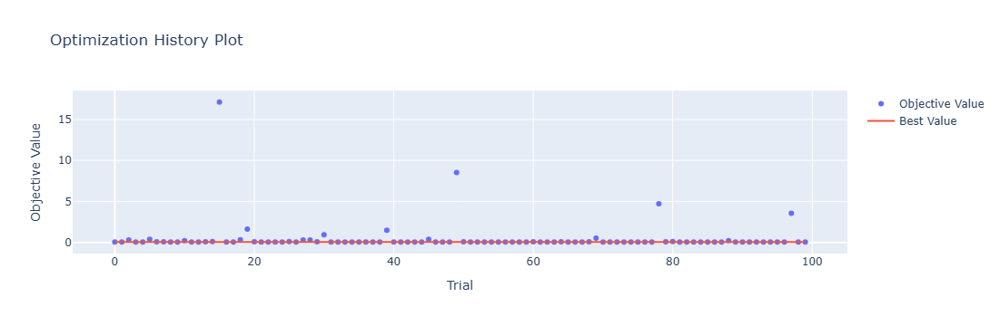

In [4]:
optuna.visualization.plot_optimization_history(study)

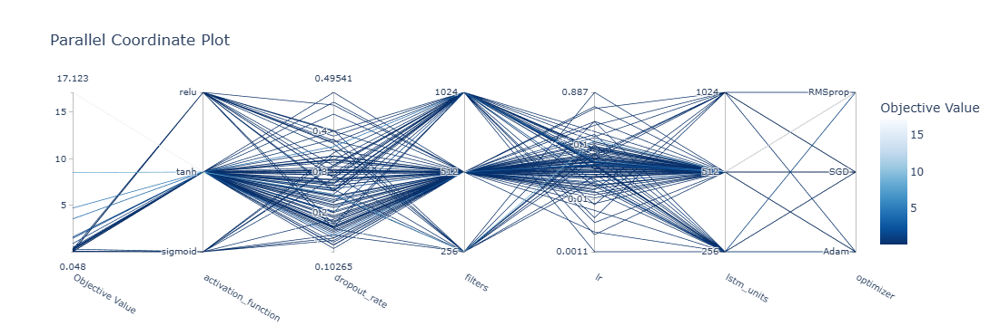

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

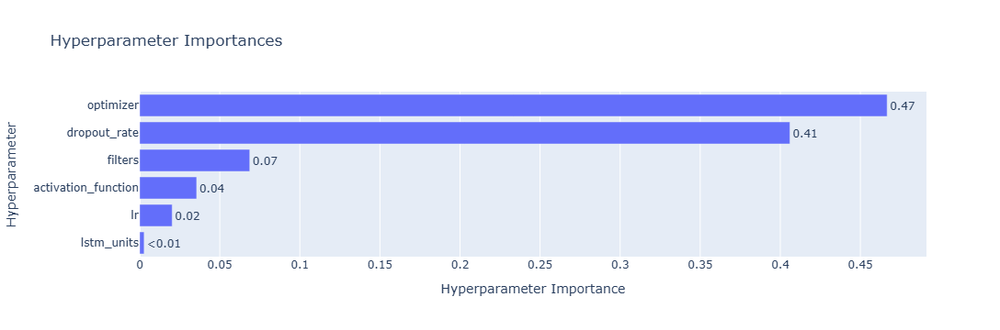

In [6]:
optuna.visualization.plot_param_importances(study)

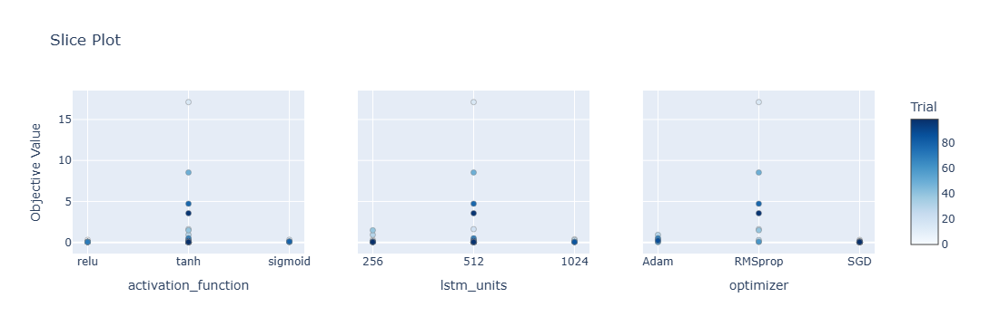

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

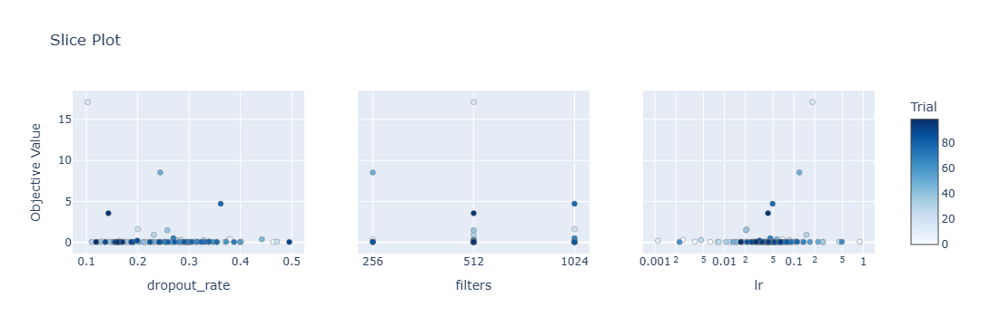

In [8]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate', 'filters'])

[[ 5.39  4.3   6.51 ... 13.73  8.35  9.05]
 [ 8.03  6.78  8.21 ... 17.14 11.74 12.27]
 [ 5.48  4.27  5.49 ... 13.3   9.17  8.6 ]
 ...
 [ 4.55  3.1   4.22 ... 12.8   7.91  6.65]
 [ 4.44  3.4   5.39 ... 12.34  7.74  6.78]
 [ 4.14  2.75  4.12 ... 10.6   7.07  6.41]]
Epoch 1/100
84/84 [==============================] - 18s 62ms/step - loss: 0.1080 - accuracy: 0.6310 - mae: 0.0940 - rmse: 0.1080 - mape: 15.9287 - pearson: 0.6375 - val_loss: 0.0731 - val_accuracy: 0.2000 - val_mae: 0.0597 - val_rmse: 0.0731 - val_mape: 10.3778 - val_pearson: 0.6803
Epoch 2/100
84/84 [==============================] - 2s 24ms/step - loss: 0.0714 - accuracy: 0.7500 - mae: 0.0584 - rmse: 0.0714 - mape: 9.8632 - pearson: 0.6902 - val_loss: 0.0629 - val_accuracy: 0.8000 - val_mae: 0.0542 - val_rmse: 0.0629 - val_mape: 9.6579 - val_pearson: 0.7722
Epoch 3/100
84/84 [==============================] - 2s 23ms/step - loss: 0.0705 - accuracy: 0.7500 - mae: 0.0577 - rmse: 0.0705 - mape: 9.7252 - pearson: 0.6758 - val_l

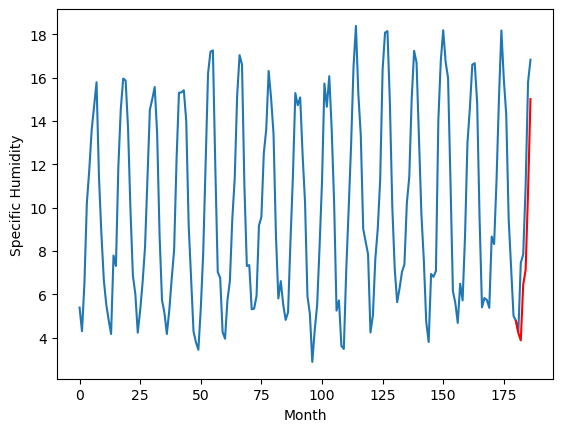

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.74		5.57		-0.17
6.45		6.14		-0.31
8.66		7.61		-1.05
8.88		8.10		-0.78
11.37		10.73		-0.64
16.12		14.84		-1.28
[180, 181, 182, 183, 184, 185, 186]
[7.05, 5.572249456644058, 6.139392420053482, 7.605989857912063, 8.097373440265656, 10.728347494602204, 14.84368629693985]


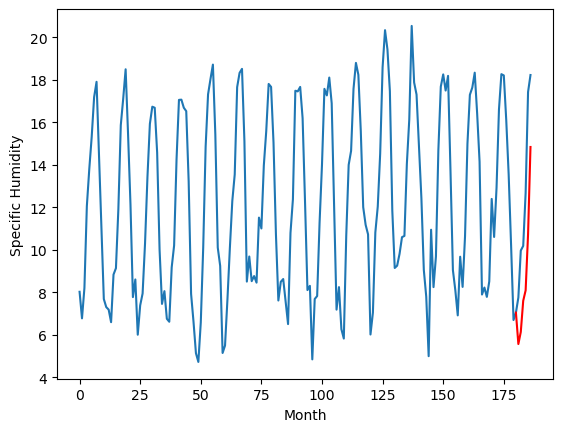

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.41		8.07		-0.34
8.56		8.35		-0.21
10.41		10.10		-0.31
10.65		10.76		0.11
13.41		13.51		0.10
18.03		17.96		-0.07
[180, 181, 182, 183, 184, 185, 186]
[5.06, 8.072224813252687, 8.347928779870271, 10.09663953140378, 10.758967536240815, 13.50883116081357, 17.960561412125827]


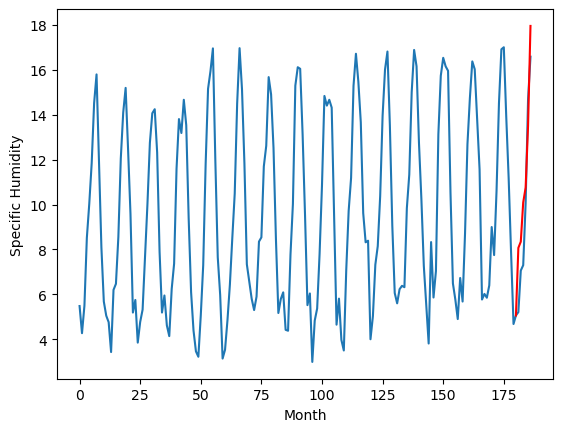

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.55		5.70		0.15
5.46		5.88		0.42
8.91		8.03		-0.88
9.48		8.52		-0.96
12.99		11.89		-1.10
16.89		15.91		-0.98
[180, 181, 182, 183, 184, 185, 186]
[7.05, 5.699131425023079, 5.876290749311448, 8.029186438322068, 8.519149820804596, 11.891247551441193, 15.911150734424591]


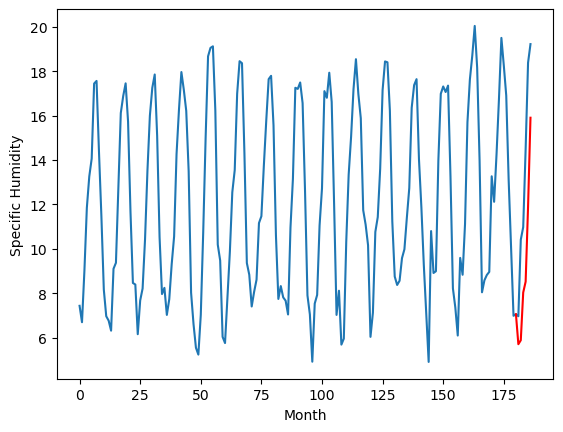

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.36		7.67		0.31
6.96		7.27		0.31
9.80		9.97		0.17
11.20		10.53		-0.67
15.21		14.46		-0.75
18.90		18.28		-0.62
[180, 181, 182, 183, 184, 185, 186]
[5.2, 7.670878343582153, 7.270190351009369, 9.96707593679428, 10.532796733379364, 14.457523696422577, 18.2752290892601]


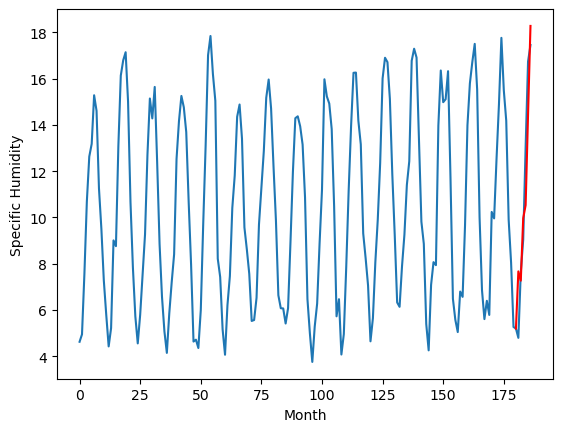

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.02		4.55		0.53
4.61		4.88		0.27
6.18		6.22		0.04
7.19		7.03		-0.16
9.69		9.18		-0.51
14.95		13.83		-1.12
[180, 181, 182, 183, 184, 185, 186]
[5.16, 4.549512428343296, 4.882850450575352, 6.218941253721714, 7.030469698011875, 9.175841850340365, 13.827479881346225]


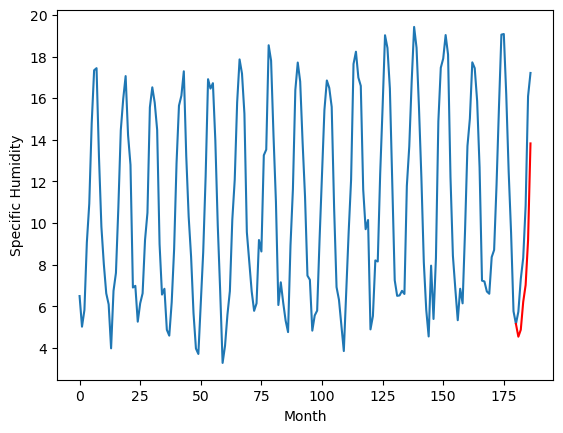

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.35		6.43		0.08
6.40		6.67		0.27
7.99		8.23		0.24
8.59		9.01		0.42
11.59		11.42		-0.17
15.97		16.03		0.06
[180, 181, 182, 183, 184, 185, 186]
[4.05, 6.430988200008869, 6.670169837772846, 8.234959967434406, 9.011179395020008, 11.415618605911732, 16.032709307968616]


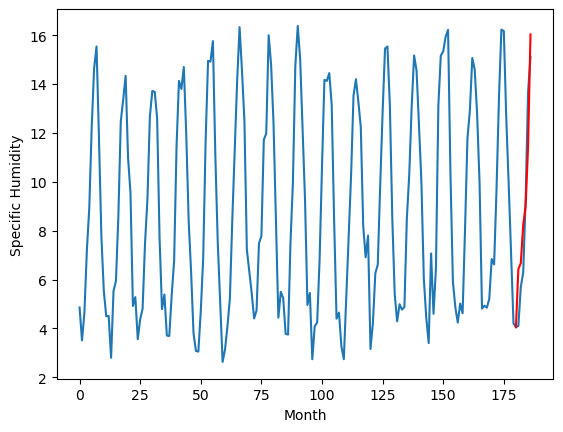

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.55		4.69		0.14
4.58		4.82		0.24
6.20		6.37		0.17
6.90		7.28		0.38
9.92		9.51		-0.41
14.19		14.35		0.16
[180, 181, 182, 183, 184, 185, 186]
[3.64, 4.688251570463181, 4.822191626429558, 6.366030485033989, 7.276596576571465, 9.508946687579154, 14.345057279467582]


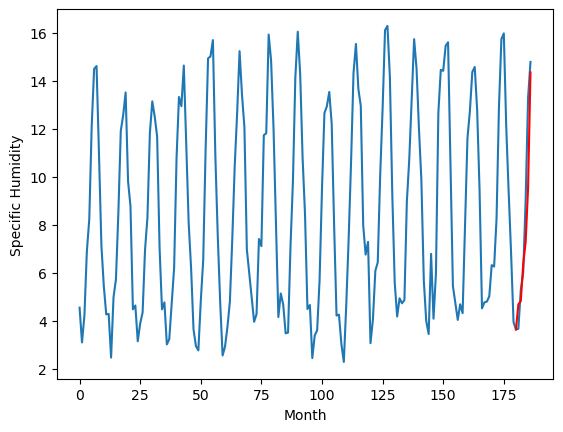

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.32		4.44		0.12
3.64		3.83		0.19
6.70		6.38		-0.32
7.43		7.32		-0.11
10.34		10.52		0.18
15.32		15.24		-0.08
[180, 181, 182, 183, 184, 185, 186]
[3.46, 4.441965761780739, 3.8338999181985853, 6.3778128057718275, 7.322368267178535, 10.524941805005074, 15.243198278546334]


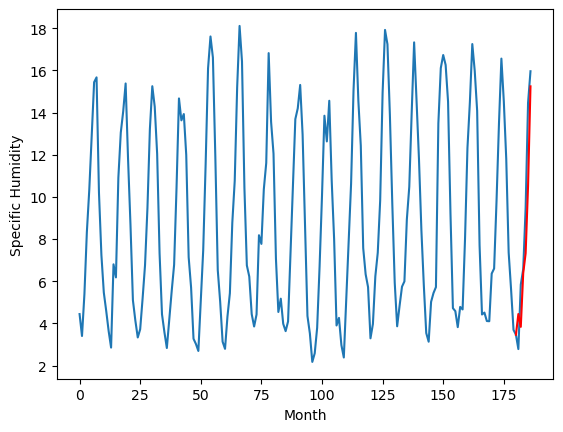

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.11		4.08		-0.03
3.66		3.63		-0.03
5.46		5.52		0.06
6.78		6.75		-0.03
8.87		8.94		0.07
13.64		14.13		0.49
[180, 181, 182, 183, 184, 185, 186]
[2.93, 4.077695878744126, 3.6294661188125614, 5.5246161842346195, 6.7532514953613285, 8.937486591339113, 14.126206817626954]


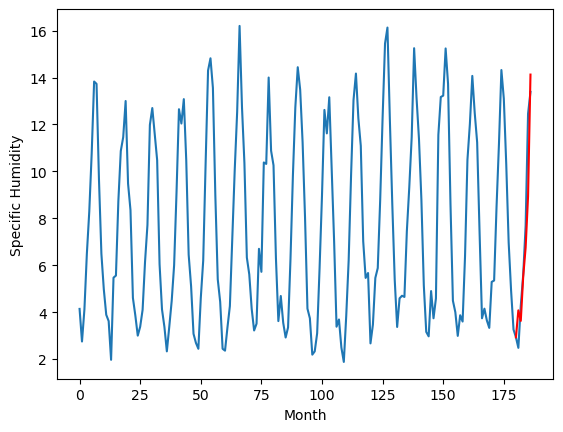

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.76		3.75		-0.01
3.02		3.17		0.15
4.64		4.91		0.27
6.24		6.22		-0.02
7.76		8.13		0.37
12.89		13.18		0.29
[180, 181, 182, 183, 184, 185, 186]
[2.74, 3.7501549863815304, 3.1709090614318844, 4.908625497817993, 6.224077358245849, 8.129559531211854, 13.178813948631287]


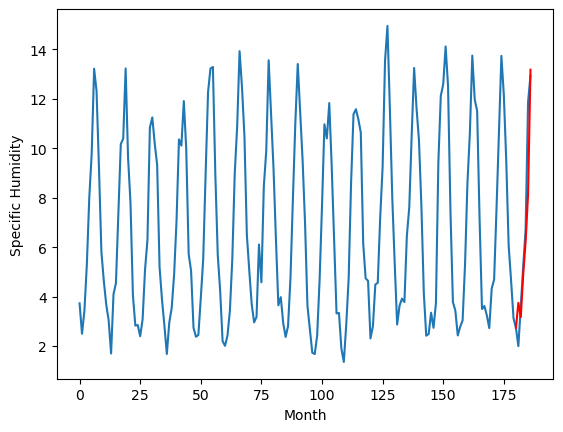

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    3.90   4.218192
1                 1    5.74   5.572249
2                 2    8.41   8.072225
3                 3    5.55   5.699131
4                 4    7.36   7.670878
5                 5    4.02   4.549512
6                 6    6.35   6.430988
7                 7    4.55   4.688252
8                 8    4.32   4.441966
9                 9    4.11   4.077696
10               10    3.76   3.750155


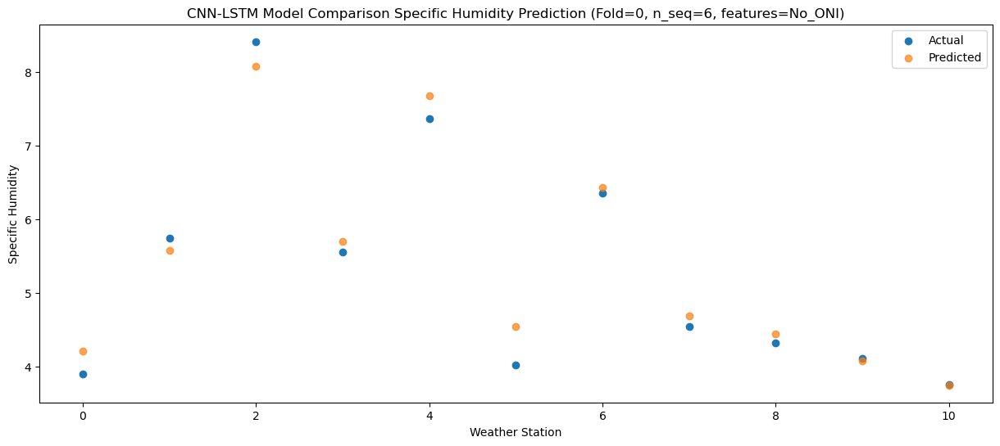

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.41   3.873882
1                 1    6.45   6.139392
2                 2    8.56   8.347929
3                 3    5.46   5.876291
4                 4    6.96   7.270190
5                 5    4.61   4.882850
6                 6    6.40   6.670170
7                 7    4.58   4.822192
8                 8    3.64   3.833900
9                 9    3.66   3.629466
10               10    3.02   3.170909


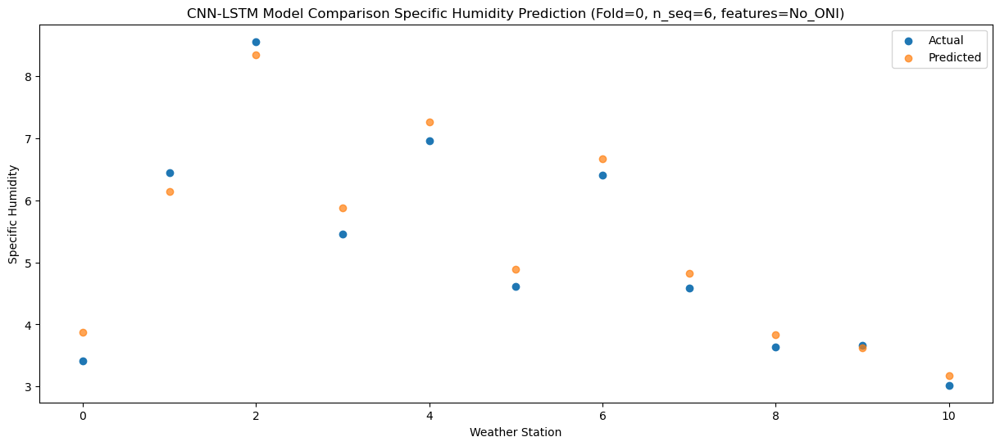

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    6.58   6.439064
1                 1    8.66   7.605990
2                 2   10.41  10.096640
3                 3    8.91   8.029186
4                 4    9.80   9.967076
5                 5    6.18   6.218941
6                 6    7.99   8.234960
7                 7    6.20   6.366030
8                 8    6.70   6.377813
9                 9    5.46   5.524616
10               10    4.64   4.908625


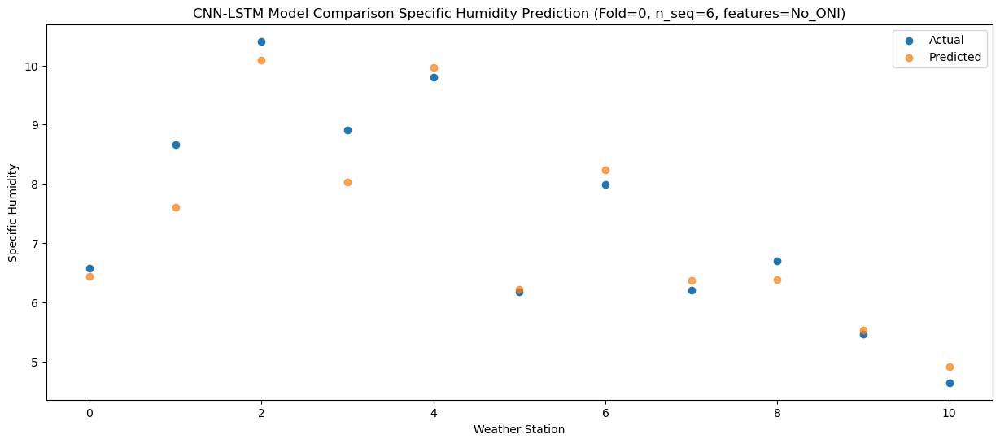

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    6.97   7.132696
1                 1    8.88   8.097373
2                 2   10.65  10.758968
3                 3    9.48   8.519150
4                 4   11.20  10.532797
5                 5    7.19   7.030470
6                 6    8.59   9.011179
7                 7    6.90   7.276597
8                 8    7.43   7.322368
9                 9    6.78   6.753251
10               10    6.24   6.224077


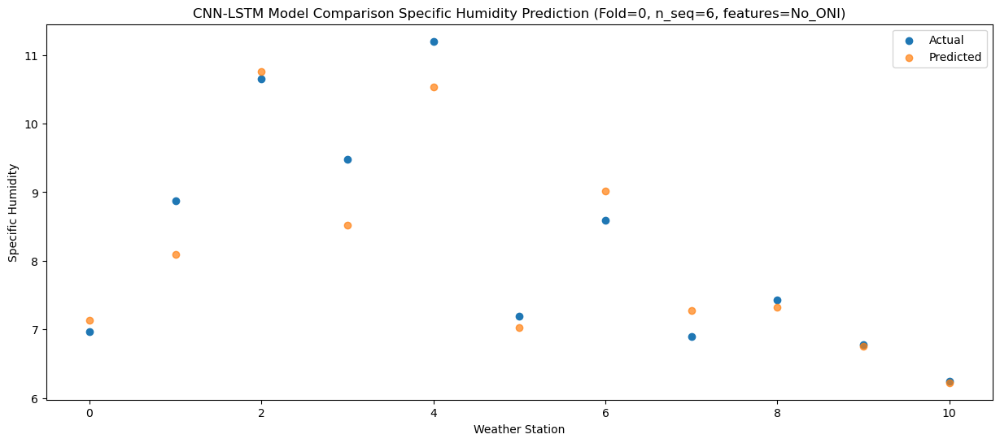

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.12  10.713213
1                 1   11.37  10.728347
2                 2   13.41  13.508831
3                 3   12.99  11.891248
4                 4   15.21  14.457524
5                 5    9.69   9.175842
6                 6   11.59  11.415619
7                 7    9.92   9.508947
8                 8   10.34  10.524942
9                 9    8.87   8.937487
10               10    7.76   8.129560


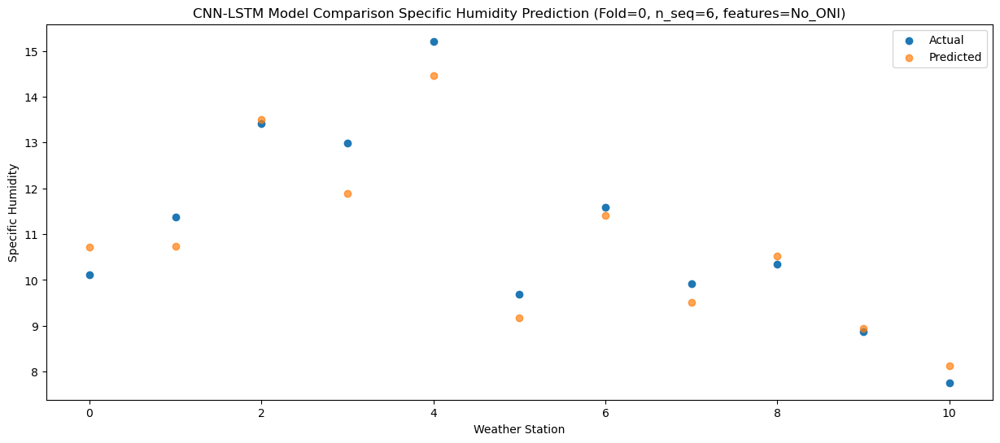

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   14.93  15.011743
1                 1   16.12  14.843686
2                 2   18.03  17.960561
3                 3   16.89  15.911151
4                 4   18.90  18.275229
5                 5   14.95  13.827480
6                 6   15.97  16.032709
7                 7   14.19  14.345057
8                 8   15.32  15.243198
9                 9   13.64  14.126207
10               10   12.89  13.178814


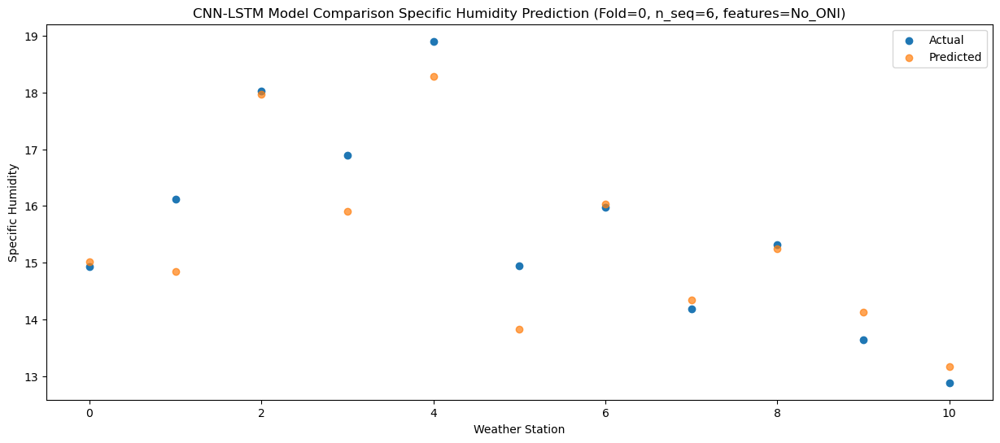

f, t:
[[ 3.9   5.74  8.41  5.55  7.36  4.02  6.35  4.55  4.32  4.11  3.76]
 [ 3.41  6.45  8.56  5.46  6.96  4.61  6.4   4.58  3.64  3.66  3.02]
 [ 6.58  8.66 10.41  8.91  9.8   6.18  7.99  6.2   6.7   5.46  4.64]
 [ 6.97  8.88 10.65  9.48 11.2   7.19  8.59  6.9   7.43  6.78  6.24]
 [10.12 11.37 13.41 12.99 15.21  9.69 11.59  9.92 10.34  8.87  7.76]
 [14.93 16.12 18.03 16.89 18.9  14.95 15.97 14.19 15.32 13.64 12.89]]
[[ 4.2181922   5.57224946  8.07222481  5.69913143  7.67087834  4.54951243
   6.4309882   4.68825157  4.44196576  4.07769588  3.75015499]
 [ 3.87388192  6.13939242  8.34792878  5.87629075  7.27019035  4.88285045
   6.67016984  4.82219163  3.83389992  3.62946612  3.17090906]
 [ 6.43906413  7.60598986 10.09663953  8.02918644  9.96707594  6.21894125
   8.23495997  6.36603049  6.37781281  5.52461618  4.9086255 ]
 [ 7.13269572  8.09737344 10.75896754  8.51914982 10.53279673  7.0304697
   9.0111794   7.27659658  7.32236827  6.7532515   6.22407736]
 [10.71321349 10.72834749 13.508

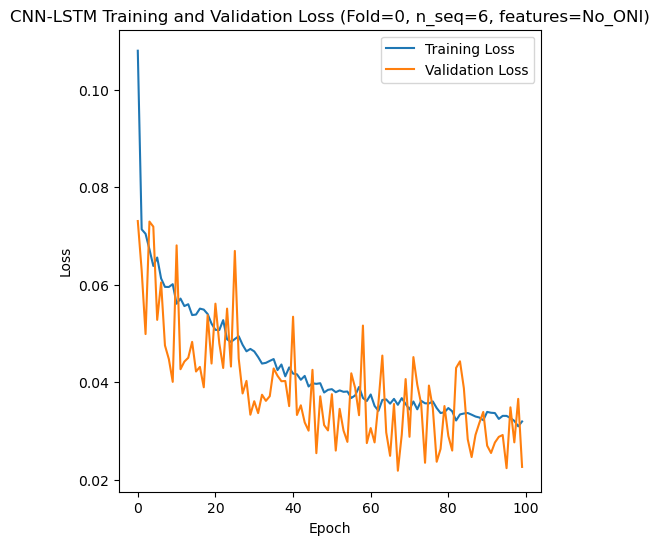

[[ 6.43  5.26  5.95 ... 15.04 10.09  9.76]
 [ 4.92  3.81  4.91 ... 12.52  8.69  7.9 ]
 [ 5.77  4.38  5.81 ... 14.28  9.78  9.52]
 ...
 [ 4.32  3.52  5.54 ... 12.    6.96  7.01]
 [ 3.07  3.12  5.08 ... 11.47  8.11  7.14]
 [ 2.37  2.06  3.5  ...  9.32  6.33  5.39]]
Epoch 1/100
84/84 [==============================] - 28s 114ms/step - loss: 0.1076 - accuracy: 0.7262 - mae: 0.0958 - rmse: 0.1076 - mape: 16.1383 - pearson: 0.6699 - val_loss: 0.0682 - val_accuracy: 0.7000 - val_mae: 0.0573 - val_rmse: 0.0682 - val_mape: 10.2685 - val_pearson: 0.7132
Epoch 2/100
84/84 [==============================] - 5s 58ms/step - loss: 0.0655 - accuracy: 0.7976 - mae: 0.0532 - rmse: 0.0655 - mape: 9.0517 - pearson: 0.7323 - val_loss: 0.0709 - val_accuracy: 0.2000 - val_mae: 0.0516 - val_rmse: 0.0709 - val_mape: 8.3700 - val_pearson: 0.6150
Epoch 3/100
84/84 [==============================] - 4s 52ms/step - loss: 0.0658 - accuracy: 0.7857 - mae: 0.0540 - rmse: 0.0658 - mape: 9.0372 - pearson: 0.7411 - val_

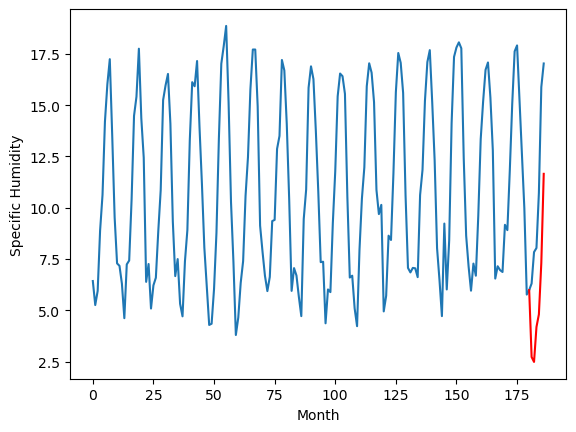

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.45		6.74		0.29
6.64		6.24		-0.40
8.17		8.26		0.09
8.53		8.96		0.43
11.45		11.68		0.23
15.43		16.16		0.73
[180, 181, 182, 183, 184, 185, 186]
[4.15, 6.740235679149627, 6.2434490251541135, 8.258128933906555, 8.957589321136474, 11.683158569335937, 16.1565625]


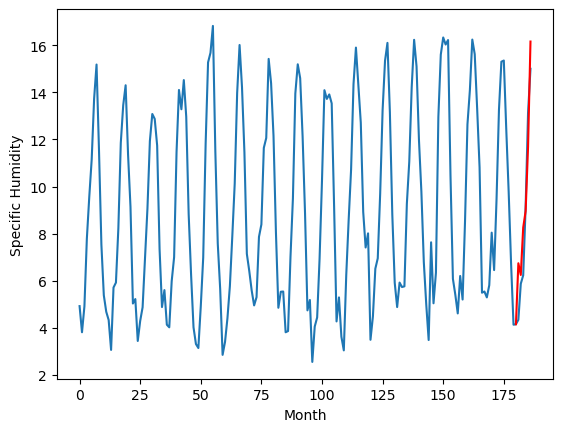

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.07		5.31		0.24
5.07		4.78		-0.29
7.69		7.05		-0.64
7.40		7.63		0.23
10.24		10.66		0.42
14.76		15.01		0.25
[180, 181, 182, 183, 184, 185, 186]
[5.12, 5.30625031709671, 4.782483501434326, 7.05075852394104, 7.625424070358276, 10.663739366531372, 15.007435960769653]


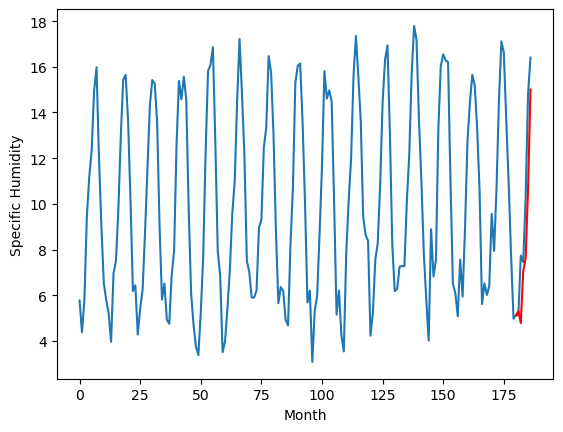

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.43		6.33		0.90
5.50		5.39		-0.11
8.14		8.04		-0.10
9.48		8.46		-1.02
13.37		12.01		-1.36
16.56		15.62		-0.94
[180, 181, 182, 183, 184, 185, 186]
[6.35, 6.33436151266098, 5.385048706531524, 8.044067223072052, 8.455162991285324, 12.010016430616378, 15.615996350049972]


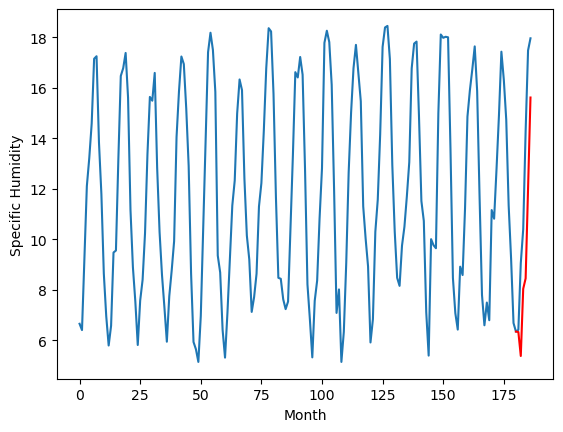

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.41		7.21		0.80
6.45		6.22		-0.23
9.17		8.95		-0.22
10.43		9.39		-1.04
14.46		13.00		-1.46
17.87		16.67		-1.20
[180, 181, 182, 183, 184, 185, 186]
[6.08, 7.205219123363495, 6.219863567352295, 8.950859460830689, 9.390996549129486, 12.995623919963837, 16.665430161952973]


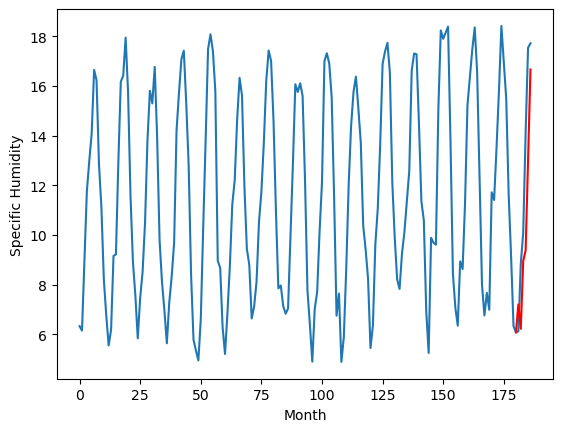

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.16		6.95		-0.21
6.53		6.00		-0.53
7.32		7.91		0.59
8.62		8.32		-0.30
12.93		11.24		-1.69
15.10		14.29		-0.81
[180, 181, 182, 183, 184, 185, 186]
[3.92, 6.951346831321716, 6.000995235443115, 7.9147424268722535, 8.320218251943588, 11.236908839941025, 14.287074970006943]


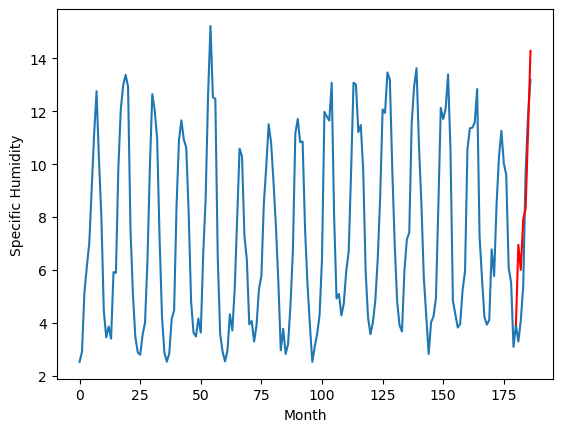

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.41		2.81		0.40
2.53		2.30		-0.23
4.09		4.24		0.15
4.71		4.97		0.26
7.64		7.62		-0.02
11.99		12.10		0.11
[180, 181, 182, 183, 184, 185, 186]
[4.16, 2.8058223617076874, 2.297968853712082, 4.2367306840419765, 4.968949664831161, 7.617321838140487, 12.098437656164169]


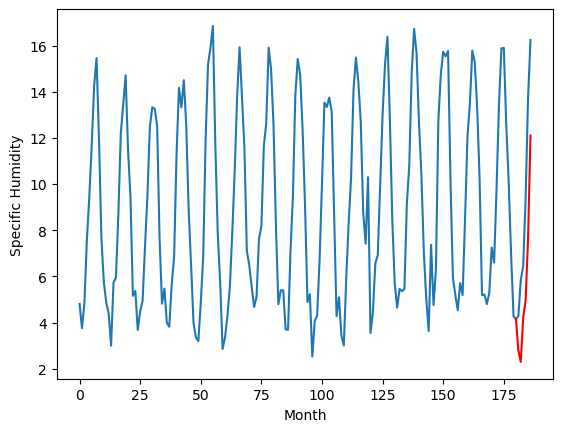

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.68		5.15		0.47
4.16		3.97		-0.19
6.89		6.71		-0.18
8.12		7.40		-0.72
11.33		10.84		-0.49
16.09		14.97		-1.12
[180, 181, 182, 183, 184, 185, 186]
[3.84, 5.153336552381515, 3.974769977331161, 6.706454185247421, 7.404723492860794, 10.844246951341628, 14.96856698155403]


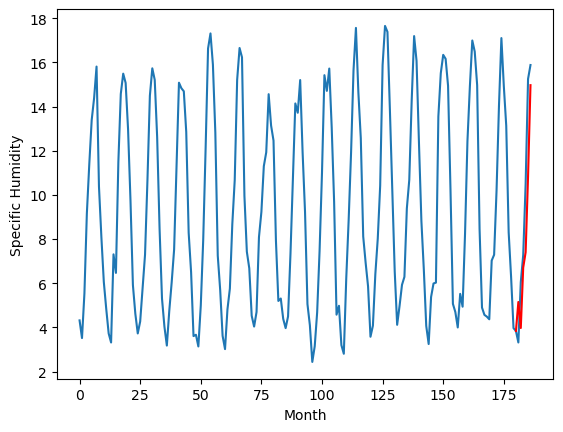

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.48		4.83		0.35
3.67		3.46		-0.21
6.28		6.26		-0.02
7.44		6.76		-0.68
11.66		10.45		-1.21
14.80		13.90		-0.90
[180, 181, 182, 183, 184, 185, 186]
[3.73, 4.834245212078095, 3.462253935337067, 6.255347616672516, 6.759265608787537, 10.44779462337494, 13.902188248634339]


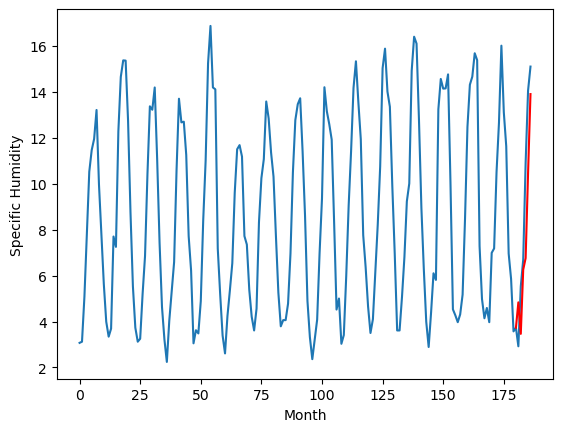

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.26		3.64		0.38
2.52		2.36		-0.16
4.34		4.55		0.21
4.51		5.00		0.49
9.66		8.14		-1.52
12.65		11.15		-1.50
[180, 181, 182, 183, 184, 185, 186]
[2.83, 3.6446287703514098, 2.3626241755485533, 4.546440608501435, 4.999353803396225, 8.137275375127793, 11.152064002752304]


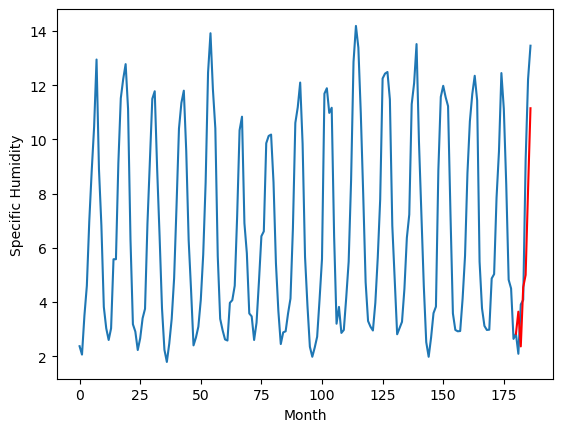

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
1.64		2.31		0.67
1.68		1.55		-0.13
2.92		2.73		-0.19
4.29		4.04		-0.25
5.82		5.62		-0.20
11.14		10.29		-0.85
[180, 181, 182, 183, 184, 185, 186]
[2.69, 2.3148103569447995, 1.5526062463223935, 2.725479147285223, 4.036080620139837, 5.624064943641424, 10.286328813880683]


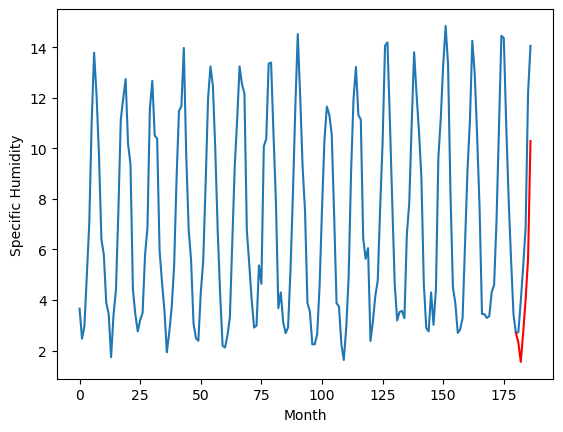

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    2.59   2.728294
1                 1    6.45   6.740236
2                 2    5.07   5.306250
3                 3    5.43   6.334362
4                 4    6.41   7.205219
5                 5    7.16   6.951347
6                 6    2.41   2.805822
7                 7    4.68   5.153337
8                 8    4.48   4.834245
9                 9    3.26   3.644629
10               10    1.64   2.314810


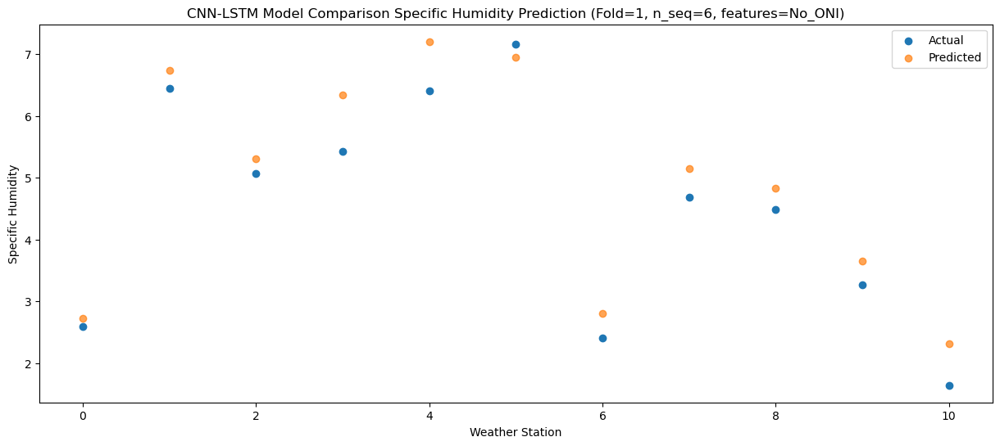

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    2.91   2.488666
1                 1    6.64   6.243449
2                 2    5.07   4.782484
3                 3    5.50   5.385049
4                 4    6.45   6.219864
5                 5    6.53   6.000995
6                 6    2.53   2.297969
7                 7    4.16   3.974770
8                 8    3.67   3.462254
9                 9    2.52   2.362624
10               10    1.68   1.552606


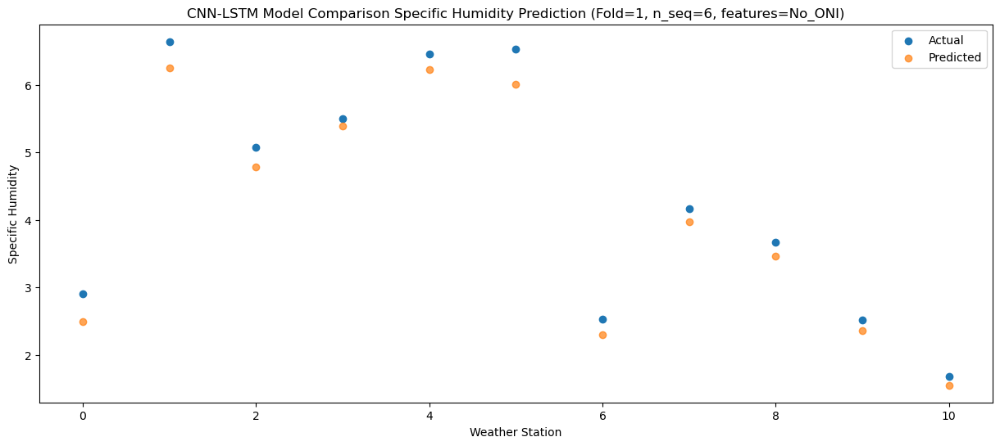

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    4.44   4.189885
1                 1    8.17   8.258129
2                 2    7.69   7.050759
3                 3    8.14   8.044067
4                 4    9.17   8.950859
5                 5    7.32   7.914742
6                 6    4.09   4.236731
7                 7    6.89   6.706454
8                 8    6.28   6.255348
9                 9    4.34   4.546441
10               10    2.92   2.725479


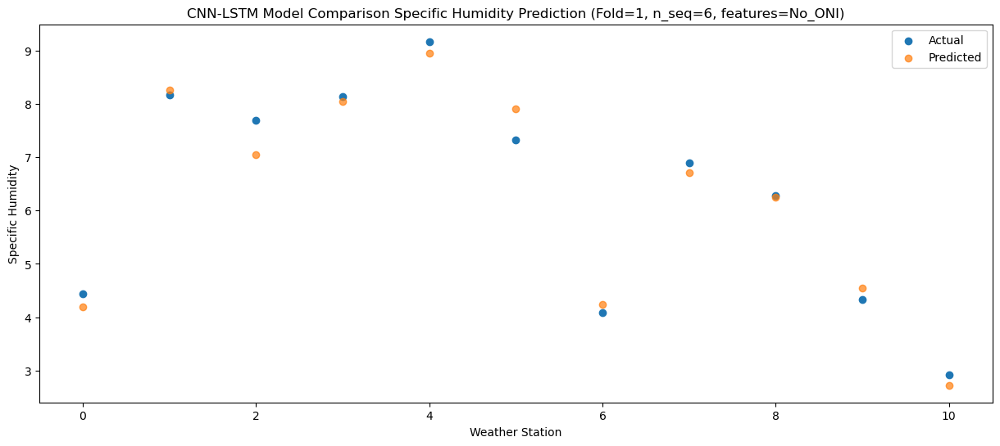

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    4.64   4.803894
1                 1    8.53   8.957589
2                 2    7.40   7.625424
3                 3    9.48   8.455163
4                 4   10.43   9.390997
5                 5    8.62   8.320218
6                 6    4.71   4.968950
7                 7    8.12   7.404723
8                 8    7.44   6.759266
9                 9    4.51   4.999354
10               10    4.29   4.036081


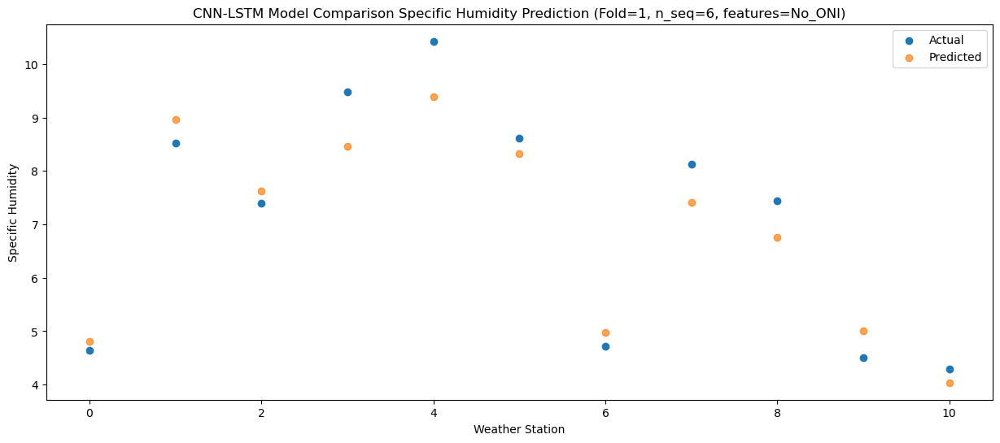

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0    7.32   7.306106
1                 1   11.45  11.683159
2                 2   10.24  10.663739
3                 3   13.37  12.010016
4                 4   14.46  12.995624
5                 5   12.93  11.236909
6                 6    7.64   7.617322
7                 7   11.33  10.844247
8                 8   11.66  10.447795
9                 9    9.66   8.137275
10               10    5.82   5.624065


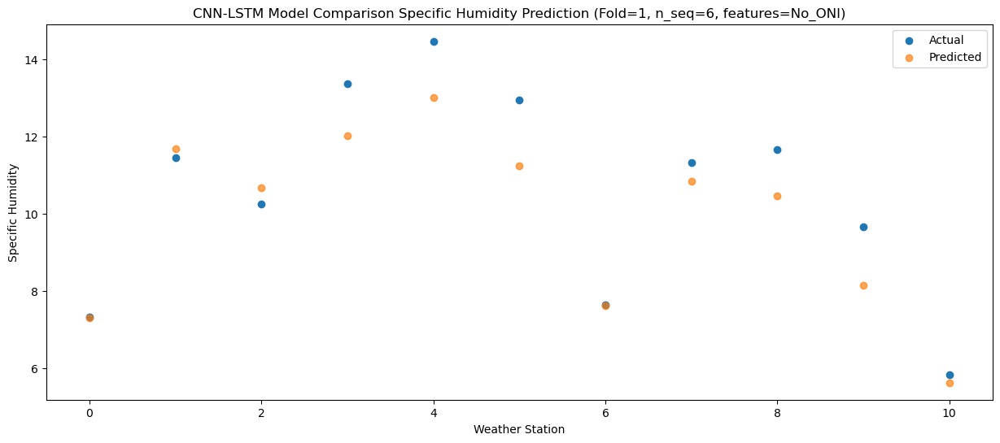

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   12.48  11.652992
1                 1   15.43  16.156562
2                 2   14.76  15.007436
3                 3   16.56  15.615996
4                 4   17.87  16.665430
5                 5   15.10  14.287075
6                 6   11.99  12.098438
7                 7   16.09  14.968567
8                 8   14.80  13.902188
9                 9   12.65  11.152064
10               10   11.14  10.286329


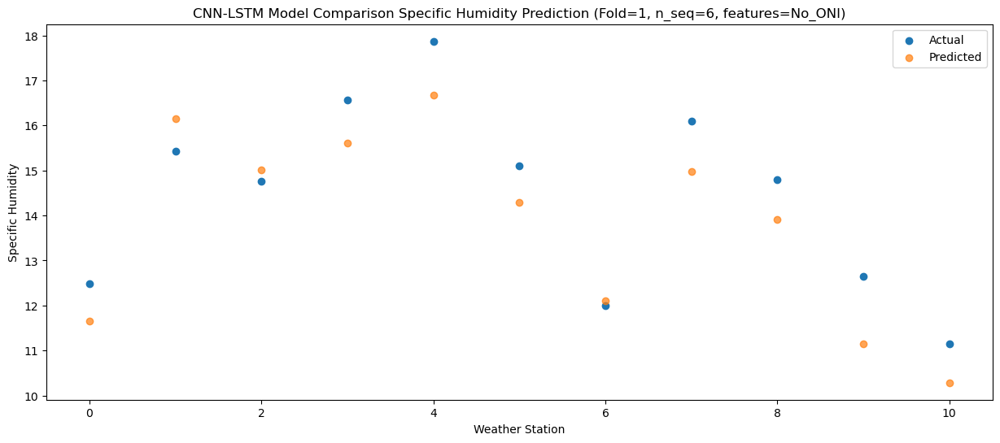

f, t:
[[ 2.59  6.45  5.07  5.43  6.41  7.16  2.41  4.68  4.48  3.26  1.64]
 [ 2.91  6.64  5.07  5.5   6.45  6.53  2.53  4.16  3.67  2.52  1.68]
 [ 4.44  8.17  7.69  8.14  9.17  7.32  4.09  6.89  6.28  4.34  2.92]
 [ 4.64  8.53  7.4   9.48 10.43  8.62  4.71  8.12  7.44  4.51  4.29]
 [ 7.32 11.45 10.24 13.37 14.46 12.93  7.64 11.33 11.66  9.66  5.82]
 [12.48 15.43 14.76 16.56 17.87 15.1  11.99 16.09 14.8  12.65 11.14]]
[[ 2.72829371  6.74023568  5.30625032  6.33436151  7.20521912  6.95134683
   2.80582236  5.15333655  4.83424521  3.64462877  2.31481036]
 [ 2.48866619  6.24344903  4.7824835   5.38504871  6.21986357  6.00099524
   2.29796885  3.97476998  3.46225394  2.36262418  1.55260625]
 [ 4.18988455  8.25812893  7.05075852  8.04406722  8.95085946  7.91474243
   4.23673068  6.70645419  6.25534762  4.54644061  2.72547915]
 [ 4.80389447  8.95758932  7.62542407  8.45516299  9.39099655  8.32021825
   4.96894966  7.40472349  6.75926561  4.9993538   4.03608062]
 [ 7.3061058  11.68315857 10.66

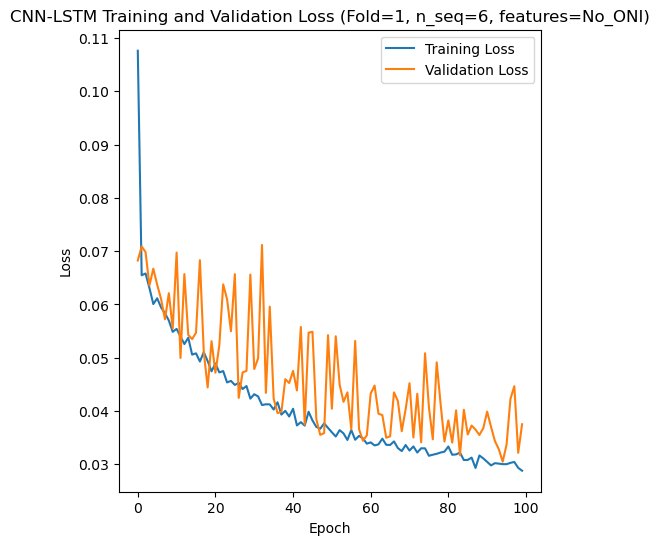

[[ 4.97  3.84  5.83 ... 12.86  8.48  8.25]
 [ 2.46  2.06  3.48 ...  9.57  6.71  5.1 ]
 [ 8.78  8.15  9.01 ... 20.36 15.38 12.95]
 ...
 [ 1.89  2.51  2.73 ...  7.42  4.53  3.35]
 [ 5.04  4.9   5.93 ... 10.09  8.19  4.88]
 [ 5.06  3.79  4.84 ... 13.58  8.96  7.8 ]]
Epoch 1/100
84/84 [==============================] - 28s 128ms/step - loss: 0.1079 - accuracy: 0.7500 - mae: 0.0947 - rmse: 0.1079 - mape: 16.0441 - pearson: 0.6588 - val_loss: 0.0310 - val_accuracy: 1.0000 - val_mae: 0.0258 - val_rmse: 0.0310 - val_mape: 4.1946 - val_pearson: 0.9434
Epoch 2/100
84/84 [==============================] - 4s 53ms/step - loss: 0.0668 - accuracy: 0.7738 - mae: 0.0542 - rmse: 0.0668 - mape: 9.1312 - pearson: 0.7274 - val_loss: 0.0465 - val_accuracy: 1.0000 - val_mae: 0.0381 - val_rmse: 0.0465 - val_mape: 6.7165 - val_pearson: 0.8885
Epoch 3/100
84/84 [==============================] - 6s 67ms/step - loss: 0.0659 - accuracy: 0.6786 - mae: 0.0541 - rmse: 0.0659 - mape: 9.1252 - pearson: 0.7246 - val_l

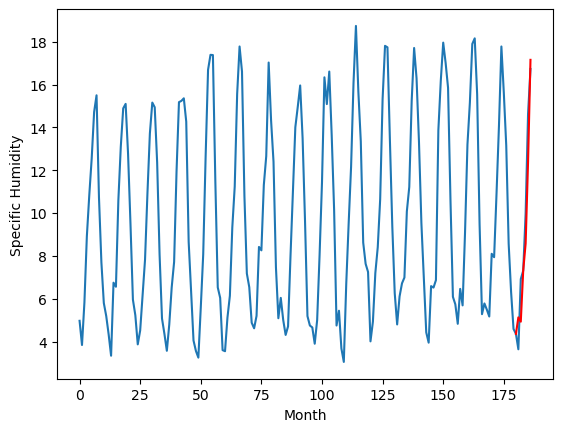

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.92		5.38		0.46
4.24		4.95		0.71
6.09		7.13		1.04
6.21		8.00		1.79
11.33		12.02		0.69
14.24		15.26		1.02
[180, 181, 182, 183, 184, 185, 186]
[2.82, 5.378939629793167, 4.950093896389007, 7.125240476131439, 8.001684935092925, 12.021379740238189, 15.262312681674956]


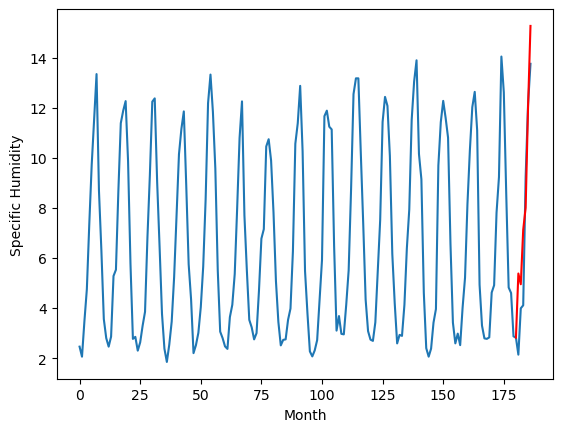

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.95		2.68		-0.27
5.08		3.47		-1.61
5.30		4.43		-0.87
6.27		5.29		-0.98
7.58		8.09		0.51
11.36		12.54		1.18
[180, 181, 182, 183, 184, 185, 186]
[9.16, 2.6795101529359817, 3.466017580628395, 4.429506338238716, 5.291060126423836, 8.088487065434457, 12.542828953862191]


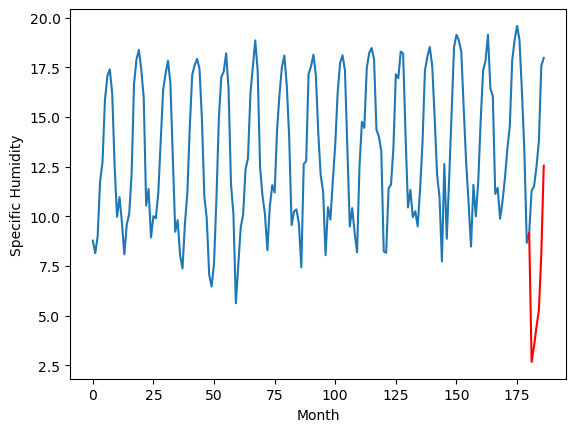

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.70		8.58		0.88
7.87		8.61		0.74
8.51		9.55		1.04
9.86		11.19		1.33
11.54		13.24		1.70
16.14		18.34		2.20
[180, 181, 182, 183, 184, 185, 186]
[2.44, 8.583979039192199, 8.612121960818767, 9.550933739840984, 11.185608765780925, 13.235388657748699, 18.34487285345793]


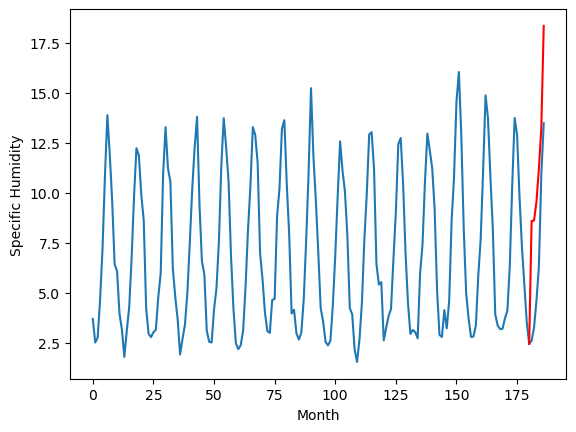

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.82		3.92		0.10
3.80		4.28		0.48
7.09		6.33		-0.76
7.11		7.25		0.14
10.31		11.07		0.76
14.20		15.62		1.42
[180, 181, 182, 183, 184, 185, 186]
[6.65, 3.9199612164497375, 4.282890679836273, 6.330653312206268, 7.254081132411956, 11.073812129497528, 15.616274955272674]


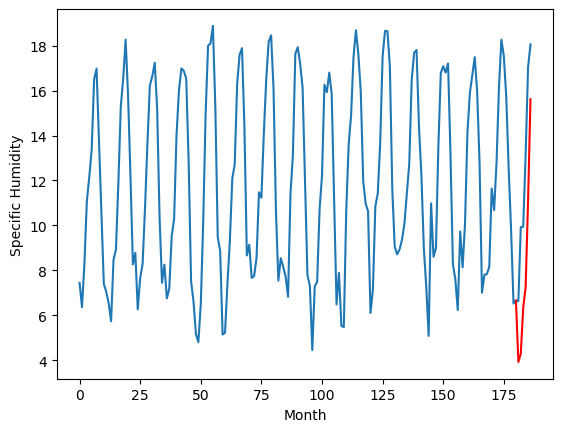

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.31		7.70		0.39
7.26		7.56		0.30
10.25		10.03		-0.22
11.82		11.06		-0.76
16.65		15.27		-1.38
19.29		19.35		0.06
[180, 181, 182, 183, 184, 185, 186]
[6.19, 7.699288549423218, 7.562901201248169, 10.025978507995607, 11.058533849716188, 15.273725214004518, 19.35149640083313]


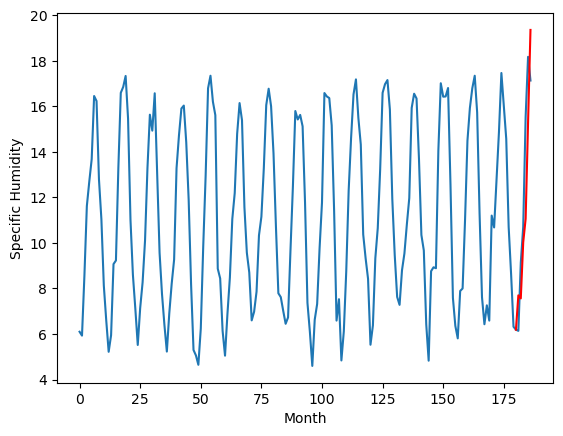

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.00		6.34		0.34
5.67		6.02		0.35
8.53		8.62		0.09
9.85		9.71		-0.14
14.05		14.00		-0.05
17.80		18.06		0.26
[180, 181, 182, 183, 184, 185, 186]
[4.78, 6.3355377972126, 6.018089628219604, 8.619682884216308, 9.711779928207397, 14.001537656784057, 18.06396613121033]


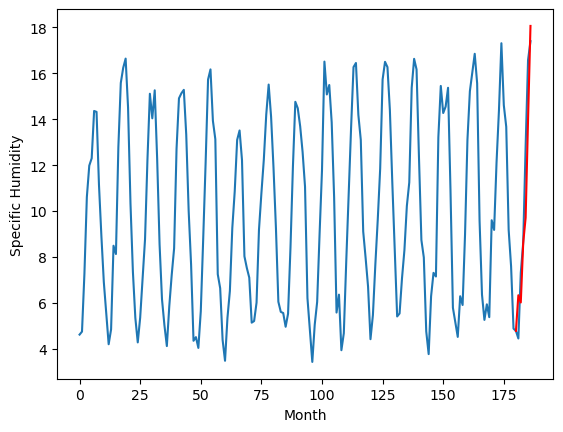

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.90		5.15		0.25
4.77		5.14		0.37
4.86		6.29		1.43
5.16		7.01		1.85
5.28		10.05		4.77
7.94		12.89		4.95
[180, 181, 182, 183, 184, 185, 186]
[2.61, 5.145416672229767, 5.1376537558436395, 6.285357522666454, 7.013805079162121, 10.054778027236463, 12.889988350570203]


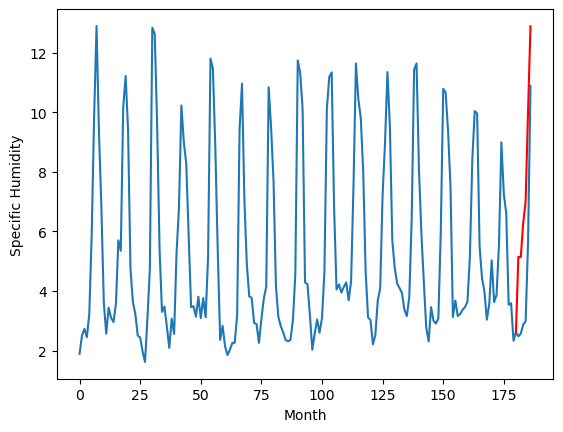

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.74		2.47		-0.27
3.27		2.44		-0.83
3.38		2.67		-0.71
4.70		3.44		-1.26
6.18		5.37		-0.81
7.43		7.78		0.35
[180, 181, 182, 183, 184, 185, 186]
[4.6, 2.4679535770416257, 2.435591242611408, 2.66565111964941, 3.440718985497951, 5.37053427785635, 7.7772911557555195]


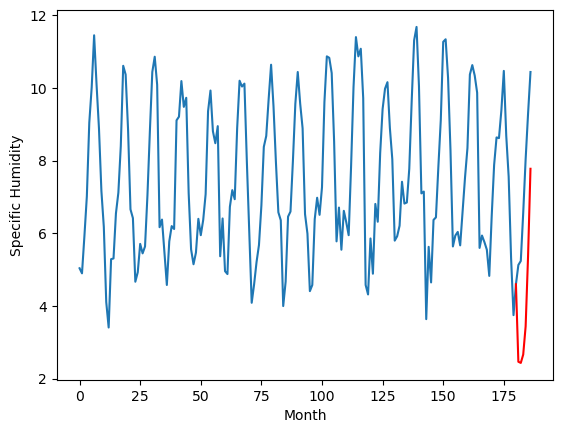

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.92		5.06		0.14
4.99		5.36		0.37
6.72		7.00		0.28
7.25		8.20		0.95
9.96		11.32		1.36
14.46		16.40		1.94
[180, 181, 182, 183, 184, 185, 186]
[4.27, 5.06243990264833, 5.36495797239244, 6.997490211352706, 8.202570005282759, 11.32371382318437, 16.399375482425093]


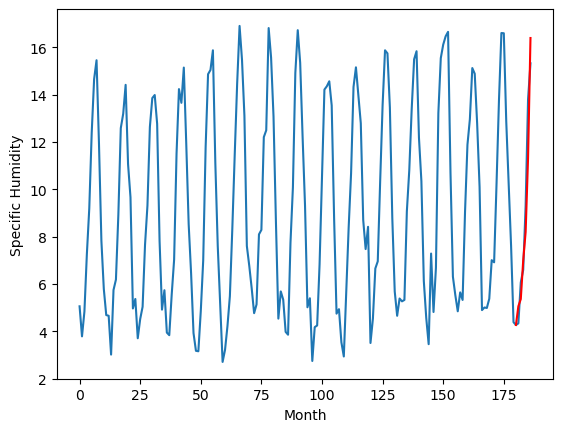

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.07		5.03		-0.04
5.31		5.19		-0.12
6.34		6.81		0.47
6.95		8.13		1.18
9.62		11.12		1.50
13.72		16.28		2.56
[180, 181, 182, 183, 184, 185, 186]
[3.91, 5.026619476675987, 5.1854778206348415, 6.810459343194961, 8.133049694299697, 11.120510545969008, 16.282079187631606]


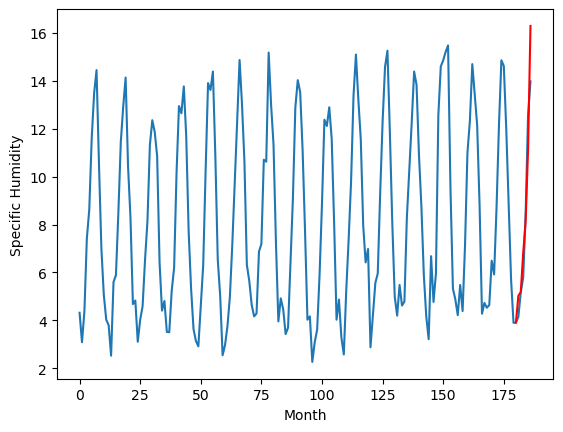

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.83   5.130618
1                 1    4.92   5.378940
2                 2    2.95   2.679510
3                 3    7.70   8.583979
4                 4    3.82   3.919961
5                 5    7.31   7.699289
6                 6    6.00   6.335538
7                 7    4.90   5.145417
8                 8    2.74   2.467954
9                 9    4.92   5.062440
10               10    5.07   5.026619


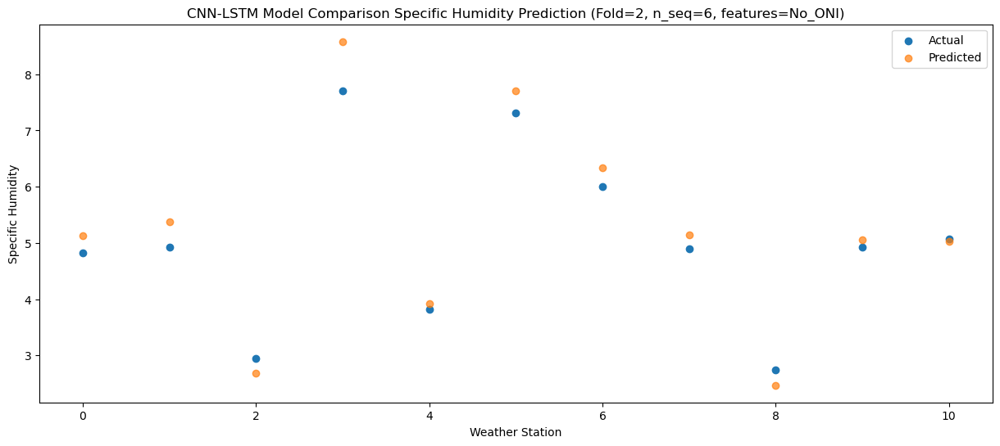

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.11   4.928867
1                 1    4.24   4.950094
2                 2    5.08   3.466018
3                 3    7.87   8.612122
4                 4    3.80   4.282891
5                 5    7.26   7.562901
6                 6    5.67   6.018090
7                 7    4.77   5.137654
8                 8    3.27   2.435591
9                 9    4.99   5.364958
10               10    5.31   5.185478


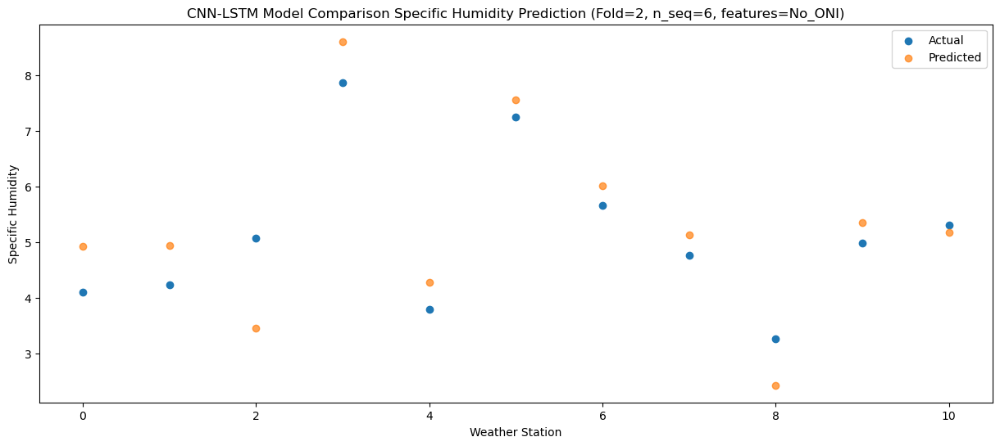

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    7.39   7.316631
1                 1    6.09   7.125240
2                 2    5.30   4.429506
3                 3    8.51   9.550934
4                 4    7.09   6.330653
5                 5   10.25  10.025979
6                 6    8.53   8.619683
7                 7    4.86   6.285358
8                 8    3.38   2.665651
9                 9    6.72   6.997490
10               10    6.34   6.810459


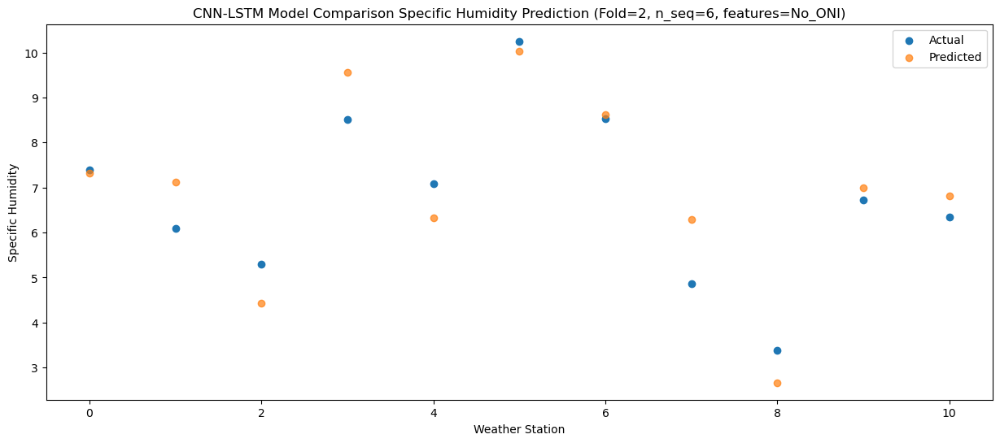

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.78   8.578369
1                 1    6.21   8.001685
2                 2    6.27   5.291060
3                 3    9.86  11.185609
4                 4    7.11   7.254081
5                 5   11.82  11.058534
6                 6    9.85   9.711780
7                 7    5.16   7.013805
8                 8    4.70   3.440719
9                 9    7.25   8.202570
10               10    6.95   8.133050


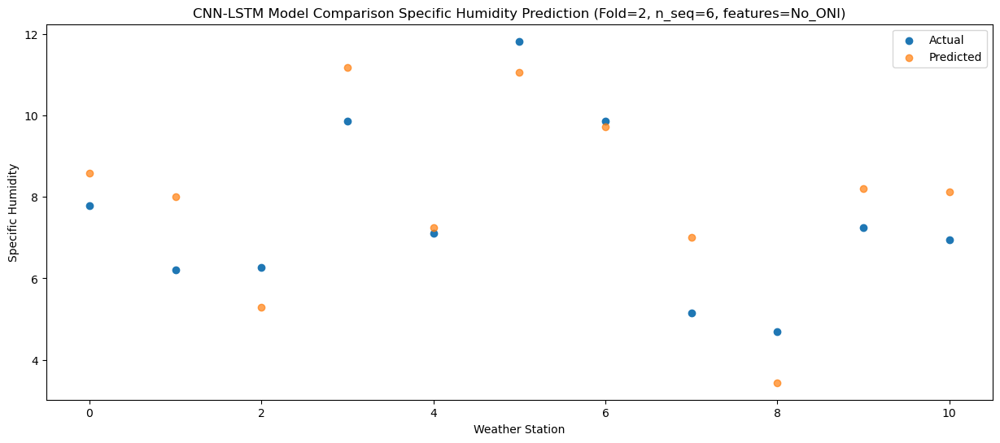

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.45  12.398001
1                 1   11.33  12.021380
2                 2    7.58   8.088487
3                 3   11.54  13.235389
4                 4   10.31  11.073812
5                 5   16.65  15.273725
6                 6   14.05  14.001538
7                 7    5.28  10.054778
8                 8    6.18   5.370534
9                 9    9.96  11.323714
10               10    9.62  11.120511


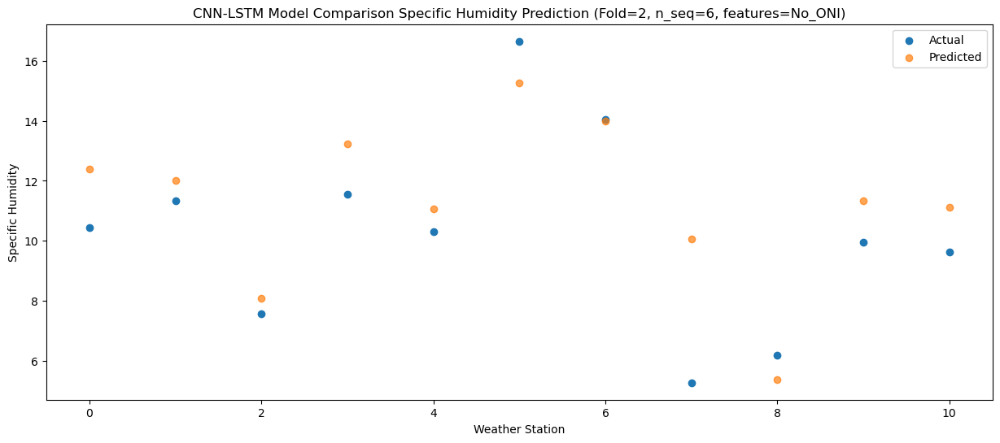

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   15.10  17.155872
1                 1   14.24  15.262313
2                 2   11.36  12.542829
3                 3   16.14  18.344873
4                 4   14.20  15.616275
5                 5   19.29  19.351496
6                 6   17.80  18.063966
7                 7    7.94  12.889988
8                 8    7.43   7.777291
9                 9   14.46  16.399375
10               10   13.72  16.282079


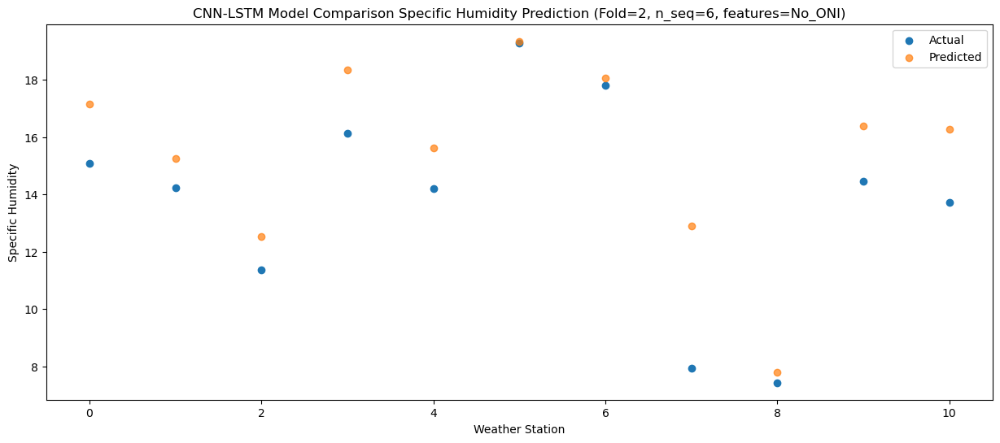

f, t:
[[ 4.83  4.92  2.95  7.7   3.82  7.31  6.    4.9   2.74  4.92  5.07]
 [ 4.11  4.24  5.08  7.87  3.8   7.26  5.67  4.77  3.27  4.99  5.31]
 [ 7.39  6.09  5.3   8.51  7.09 10.25  8.53  4.86  3.38  6.72  6.34]
 [ 7.78  6.21  6.27  9.86  7.11 11.82  9.85  5.16  4.7   7.25  6.95]
 [10.45 11.33  7.58 11.54 10.31 16.65 14.05  5.28  6.18  9.96  9.62]
 [15.1  14.24 11.36 16.14 14.2  19.29 17.8   7.94  7.43 14.46 13.72]]
[[ 5.13061768  5.37893963  2.67951015  8.58397904  3.91996122  7.69928855
   6.3355378   5.14541667  2.46795358  5.0624399   5.02661948]
 [ 4.92886735  4.9500939   3.46601758  8.61212196  4.28289068  7.5629012
   6.01808963  5.13765376  2.43559124  5.36495797  5.18547782]
 [ 7.31663109  7.12524048  4.42950634  9.55093374  6.33065331 10.02597851
   8.61968288  6.28535752  2.66565112  6.99749021  6.81045934]
 [ 8.57836939  8.00168494  5.29106013 11.18560877  7.25408113 11.05853385
   9.71177993  7.01380508  3.44071899  8.20257001  8.13304969]
 [12.39800073 12.02137974  8.088

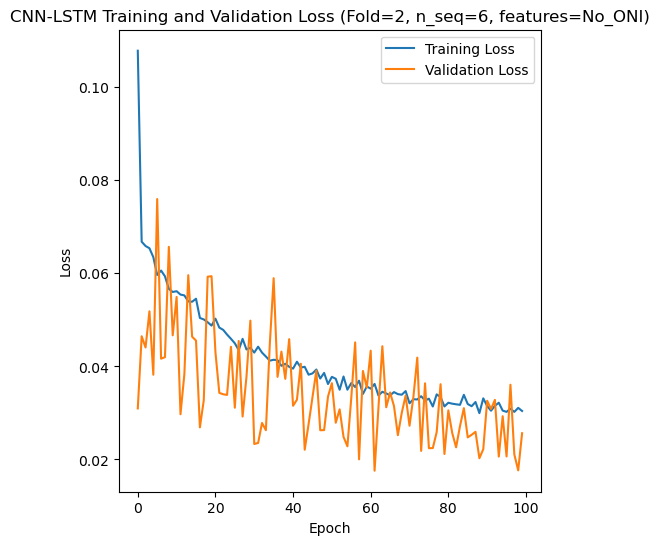

[[ 5.11  3.7   4.74 ... 13.5   8.68  7.66]
 [ 3.73  2.91  5.05 ... 11.19  6.96  6.57]
 [ 5.56  5.41  5.55 ...  8.56  7.45  5.59]
 ...
 [ 2.73  2.21  3.23 ...  5.    3.95  3.09]
 [ 5.93  5.59  5.49 ...  8.63  7.04  6.11]
 [ 3.71  2.55  2.84 ...  9.78  6.68  4.77]]
Epoch 1/100
84/84 [==============================] - 46s 363ms/step - loss: 0.0999 - accuracy: 0.6667 - mae: 0.0876 - rmse: 0.0999 - mape: 14.7070 - pearson: 0.6506 - val_loss: 0.0572 - val_accuracy: 0.9000 - val_mae: 0.0464 - val_rmse: 0.0572 - val_mape: 8.1726 - val_pearson: 0.7768
Epoch 2/100
84/84 [==============================] - 18s 207ms/step - loss: 0.0704 - accuracy: 0.6786 - mae: 0.0569 - rmse: 0.0704 - mape: 9.6068 - pearson: 0.7026 - val_loss: 0.0624 - val_accuracy: 0.1000 - val_mae: 0.0509 - val_rmse: 0.0624 - val_mape: 8.6717 - val_pearson: 0.6176
Epoch 3/100
84/84 [==============================] - 13s 155ms/step - loss: 0.0680 - accuracy: 0.7143 - mae: 0.0562 - rmse: 0.0680 - mape: 9.4449 - pearson: 0.7217 - v

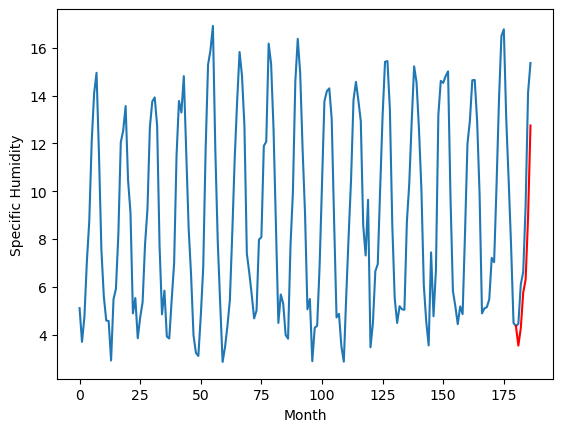

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.02		5.03		0.01
4.46		4.84		0.38
6.97		7.42		0.45
8.14		8.19		0.05
11.66		11.80		0.14
16.19		15.32		-0.87
[180, 181, 182, 183, 184, 185, 186]
[3.43, 5.028871454894543, 4.842289604842663, 7.416449465453625, 8.18917010039091, 11.796270587146282, 15.323995806872844]


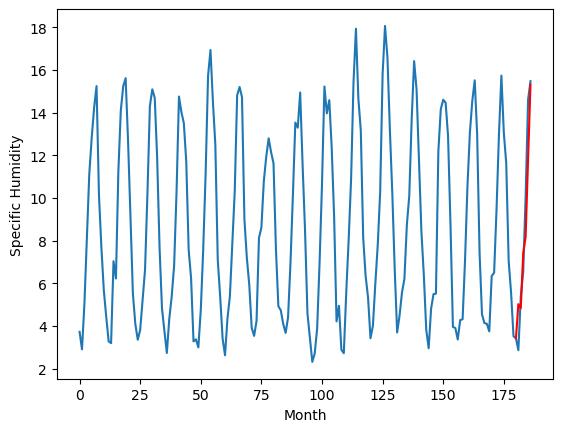

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.17		3.94		-0.23
4.11		4.36		0.25
4.19		3.92		-0.27
4.81		3.96		-0.85
5.21		5.63		0.42
7.66		6.86		-0.80
[180, 181, 182, 183, 184, 185, 186]
[5.43, 3.938185464143753, 4.364840697050095, 3.9248615014553074, 3.959203131049872, 5.62617982134223, 6.863830454200507]


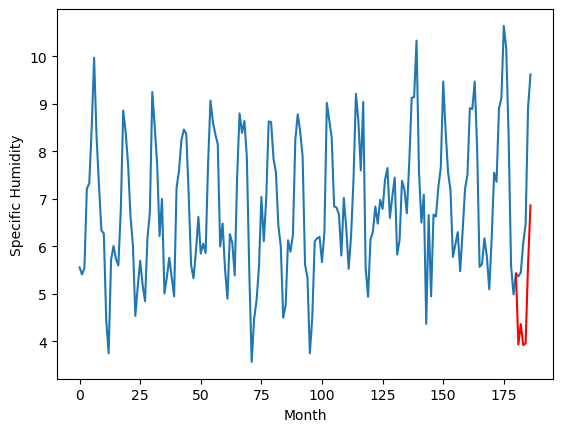

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.29		5.17		-0.12
5.22		5.42		0.20
6.52		6.94		0.42
7.71		7.89		0.18
10.24		10.11		-0.13
15.66		14.22		-1.44
[180, 181, 182, 183, 184, 185, 186]
[3.21, 5.17043632030487, 5.42216202378273, 6.9419579184055324, 7.88775667309761, 10.114410487413405, 14.222370711565016]


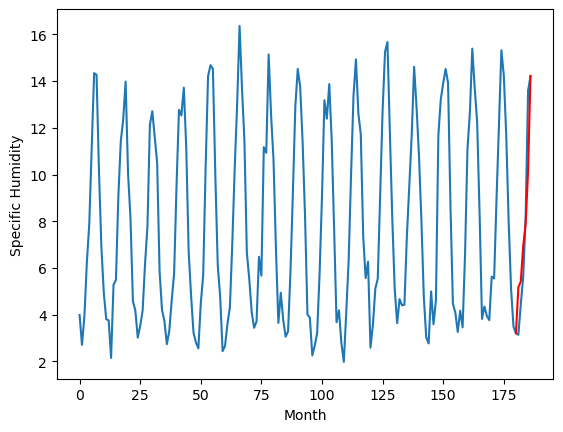

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.79		3.69		-0.10
2.96		3.51		0.55
5.44		5.58		0.14
6.50		6.56		0.06
8.92		9.32		0.40
13.38		13.24		-0.14
[180, 181, 182, 183, 184, 185, 186]
[3.04, 3.6906153464317324, 3.513893773555756, 5.579597880840302, 6.563093593120575, 9.31762211561203, 13.236236979961395]


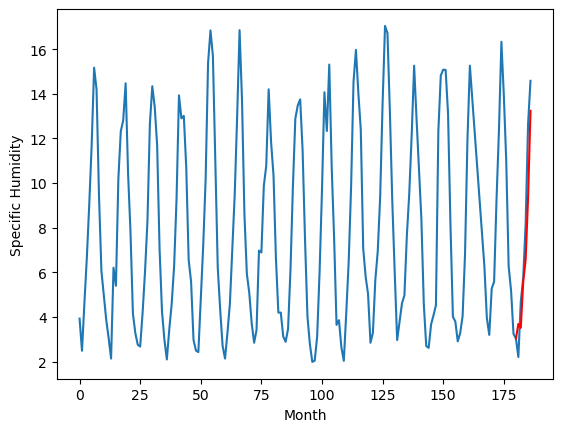

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.62		3.51		-0.11
3.10		3.38		0.28
5.13		5.29		0.16
6.43		6.40		-0.03
8.67		8.83		0.16
13.89		13.02		-0.87
[180, 181, 182, 183, 184, 185, 186]
[2.91, 3.514949404001236, 3.383207612037659, 5.2924756336212155, 6.398371510505676, 8.831999115943908, 13.019841961860656]


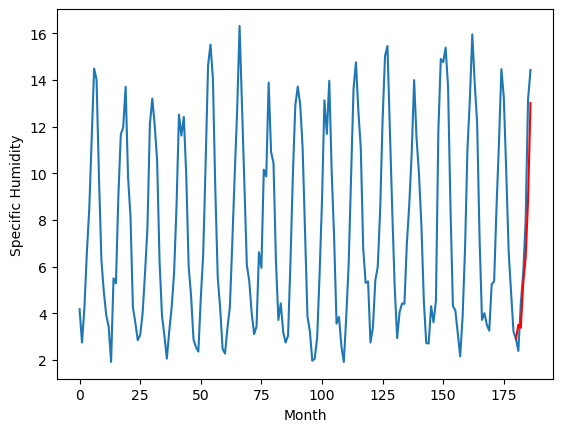

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.35		4.36		0.01
4.41		4.67		0.26
4.72		5.02		0.30
5.19		5.18		-0.01
6.59		7.47		0.88
7.92		9.15		1.23
[180, 181, 182, 183, 184, 185, 186]
[1.6, 4.358203448653221, 4.66798955976963, 5.0217509645223615, 5.176830806136131, 7.466092862486839, 9.153967656493187]


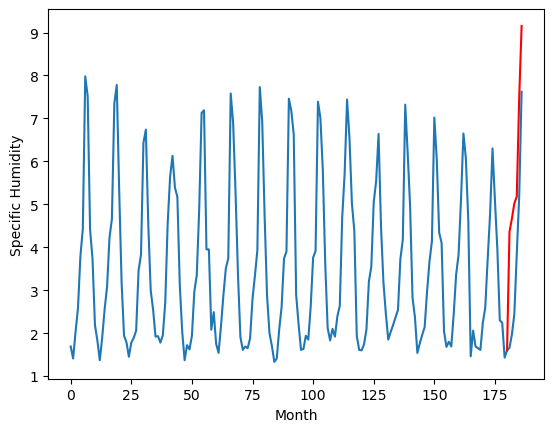

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.50		1.96		-0.54
2.02		2.27		0.25
2.32		2.09		-0.23
2.01		2.08		0.07
2.57		4.07		1.50
3.99		5.17		1.18
[180, 181, 182, 183, 184, 185, 186]
[2.86, 1.9579542005062103, 2.2686519944667816, 2.08884153008461, 2.0796081214770674, 4.071042457185685, 5.172094741426408]


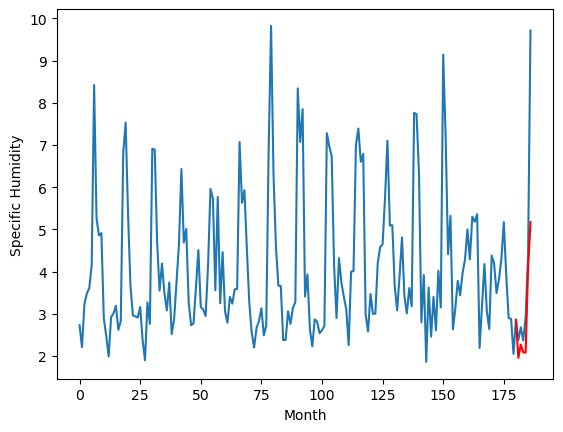

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.40		2.95		-0.45
3.05		3.50		0.45
2.70		2.99		0.29
3.63		3.02		-0.61
4.07		4.64		0.57
5.50		5.94		0.44
[180, 181, 182, 183, 184, 185, 186]
[5.65, 2.9538503247499466, 3.4961574631929397, 2.994984503388405, 3.019503574371338, 4.637526016235352, 5.93662271976471]


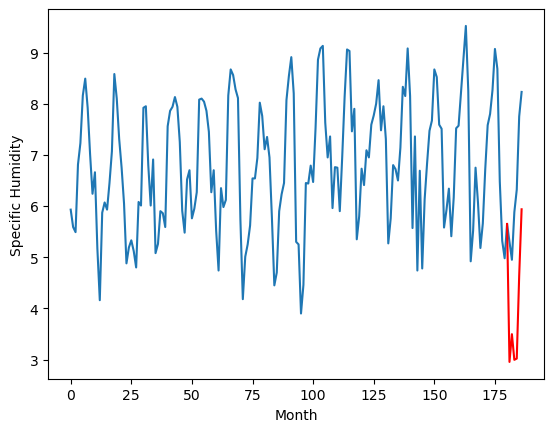

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.84		5.37		0.53
4.99		5.78		0.79
5.77		6.31		0.54
7.15		7.41		0.26
8.72		8.65		-0.07
13.62		12.59		-1.03
[180, 181, 182, 183, 184, 185, 186]
[2.54, 5.374927155971527, 5.779074631929397, 6.30791833281517, 7.411346935033798, 8.648632072210312, 12.593047641515732]


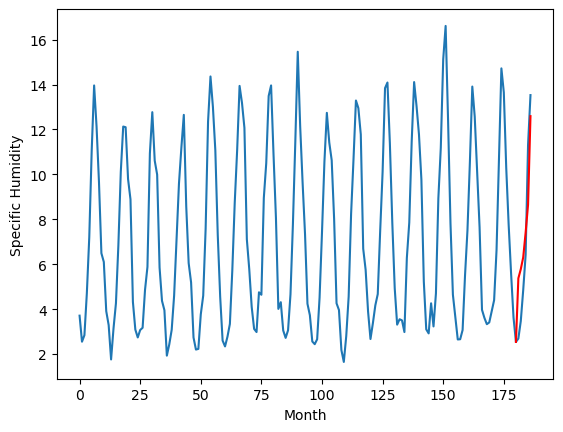

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.02		3.15		0.13
2.88		3.50		0.62
4.16		4.37		0.21
5.57		5.49		-0.08
7.16		6.98		-0.18
12.03		11.12		-0.91
[180, 181, 182, 183, 184, 185, 186]
[2.51, 3.152505359649658, 3.5042548990249633, 4.365913174152374, 5.487099668979645, 6.980240247249603, 11.117211720943452]


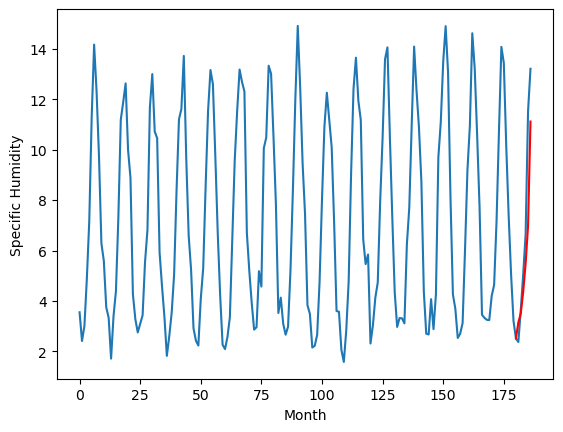

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    3.58   3.542150
1                 1    5.02   5.028871
2                 2    4.17   3.938185
3                 3    5.29   5.170436
4                 4    3.79   3.690615
5                 5    3.62   3.514949
6                 6    4.35   4.358203
7                 7    2.50   1.957954
8                 8    3.40   2.953850
9                 9    4.84   5.374927
10               10    3.02   3.152505


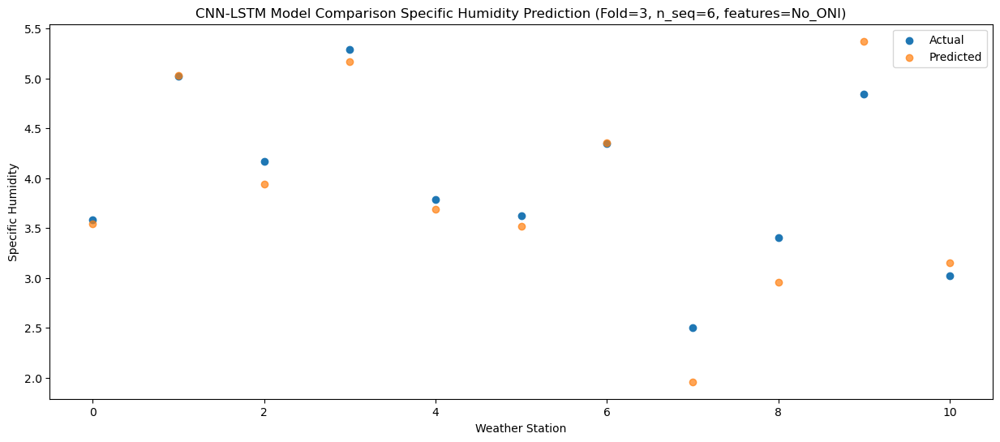

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.67   4.271948
1                 1    4.46   4.842290
2                 2    4.11   4.364841
3                 3    5.22   5.422162
4                 4    2.96   3.513894
5                 5    3.10   3.383208
6                 6    4.41   4.667990
7                 7    2.02   2.268652
8                 8    3.05   3.496157
9                 9    4.99   5.779075
10               10    2.88   3.504255


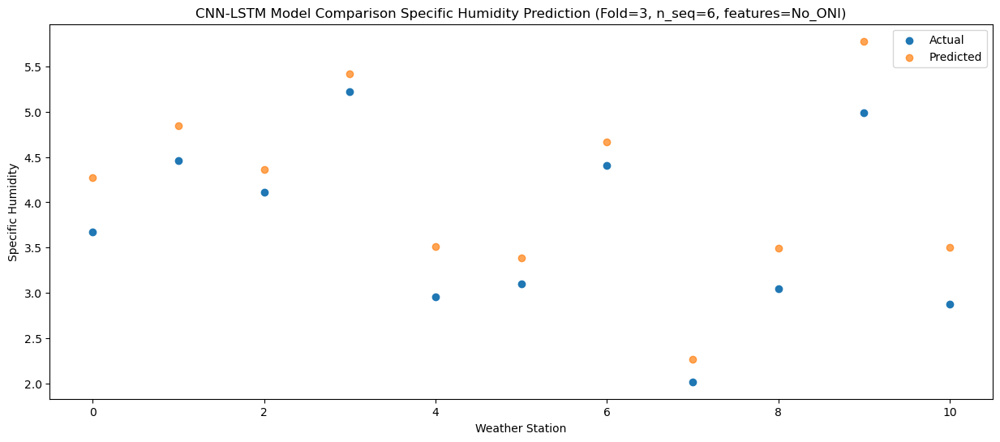

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    5.32   5.753171
1                 1    6.97   7.416449
2                 2    4.19   3.924862
3                 3    6.52   6.941958
4                 4    5.44   5.579598
5                 5    5.13   5.292476
6                 6    4.72   5.021751
7                 7    2.32   2.088842
8                 8    2.70   2.994985
9                 9    5.77   6.307918
10               10    4.16   4.365913


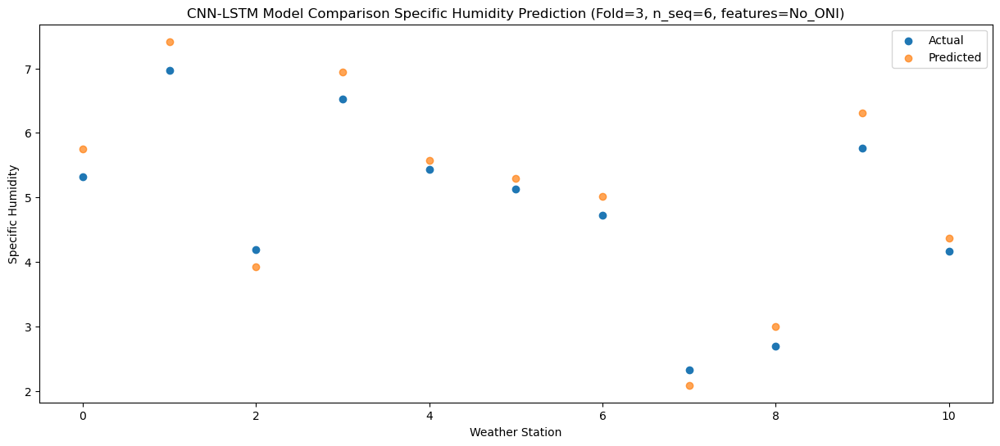

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    5.84   6.310521
1                 1    8.14   8.189170
2                 2    4.81   3.959203
3                 3    7.71   7.887757
4                 4    6.50   6.563094
5                 5    6.43   6.398372
6                 6    5.19   5.176831
7                 7    2.01   2.079608
8                 8    3.63   3.019504
9                 9    7.15   7.411347
10               10    5.57   5.487100


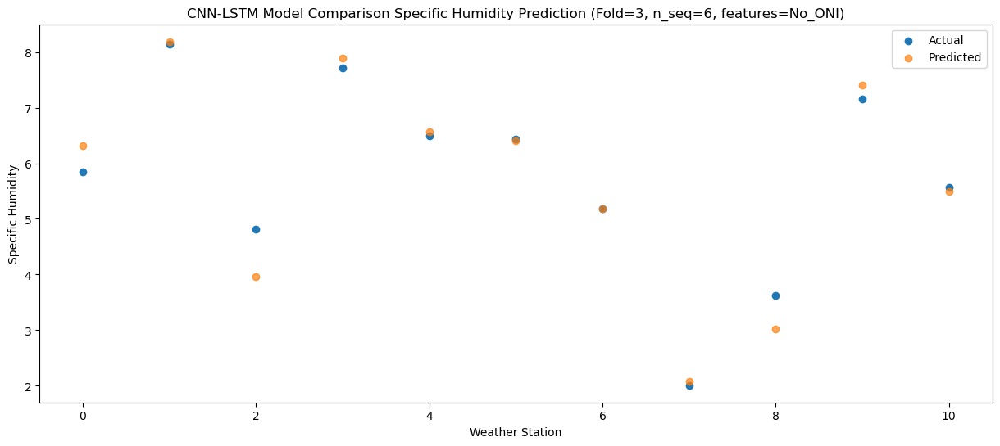

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0    8.62   8.897379
1                 1   11.66  11.796271
2                 2    5.21   5.626180
3                 3   10.24  10.114410
4                 4    8.92   9.317622
5                 5    8.67   8.831999
6                 6    6.59   7.466093
7                 7    2.57   4.071042
8                 8    4.07   4.637526
9                 9    8.72   8.648632
10               10    7.16   6.980240


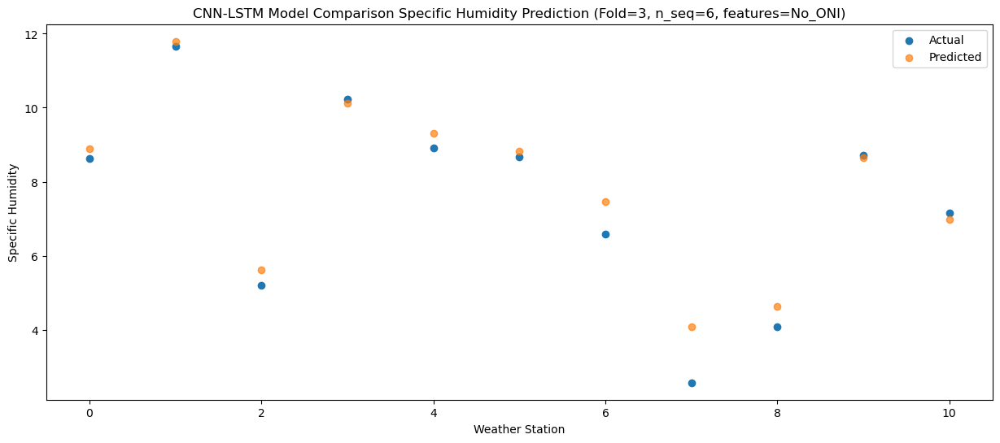

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   13.34  12.746687
1                 1   16.19  15.323996
2                 2    7.66   6.863830
3                 3   15.66  14.222371
4                 4   13.38  13.236237
5                 5   13.89  13.019842
6                 6    7.92   9.153968
7                 7    3.99   5.172095
8                 8    5.50   5.936623
9                 9   13.62  12.593048
10               10   12.03  11.117212


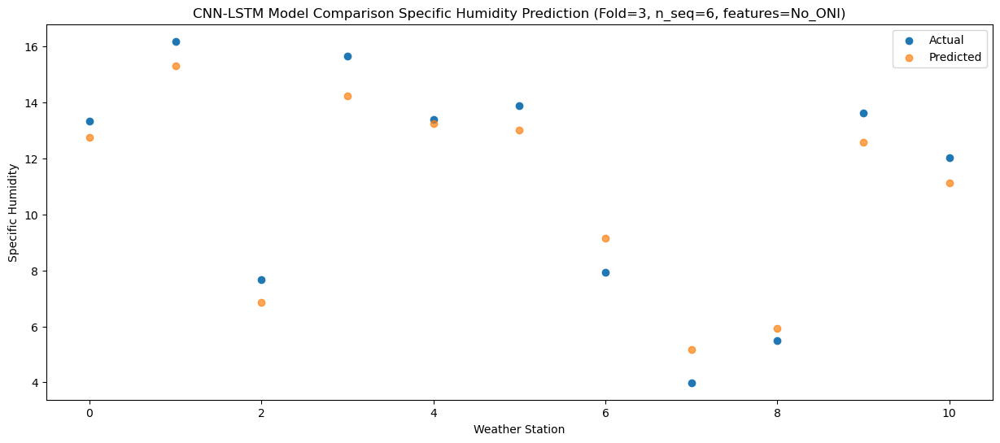

f, t:
[[ 3.58  5.02  4.17  5.29  3.79  3.62  4.35  2.5   3.4   4.84  3.02]
 [ 3.67  4.46  4.11  5.22  2.96  3.1   4.41  2.02  3.05  4.99  2.88]
 [ 5.32  6.97  4.19  6.52  5.44  5.13  4.72  2.32  2.7   5.77  4.16]
 [ 5.84  8.14  4.81  7.71  6.5   6.43  5.19  2.01  3.63  7.15  5.57]
 [ 8.62 11.66  5.21 10.24  8.92  8.67  6.59  2.57  4.07  8.72  7.16]
 [13.34 16.19  7.66 15.66 13.38 13.89  7.92  3.99  5.5  13.62 12.03]]
[[ 3.54214965  5.02887145  3.93818546  5.17043632  3.69061535  3.5149494
   4.35820345  1.9579542   2.95385032  5.37492716  3.15250536]
 [ 4.27194779  4.8422896   4.3648407   5.42216202  3.51389377  3.38320761
   4.66798956  2.26865199  3.49615746  5.77907463  3.5042549 ]
 [ 5.75317078  7.41644947  3.9248615   6.94195792  5.57959788  5.29247563
   5.02175096  2.08884153  2.9949845   6.30791833  4.36591317]
 [ 6.31052112  8.1891701   3.95920313  7.88775667  6.56309359  6.39837151
   5.17683081  2.07960812  3.01950357  7.41134694  5.48709967]
 [ 8.89737867 11.79627059  5.626

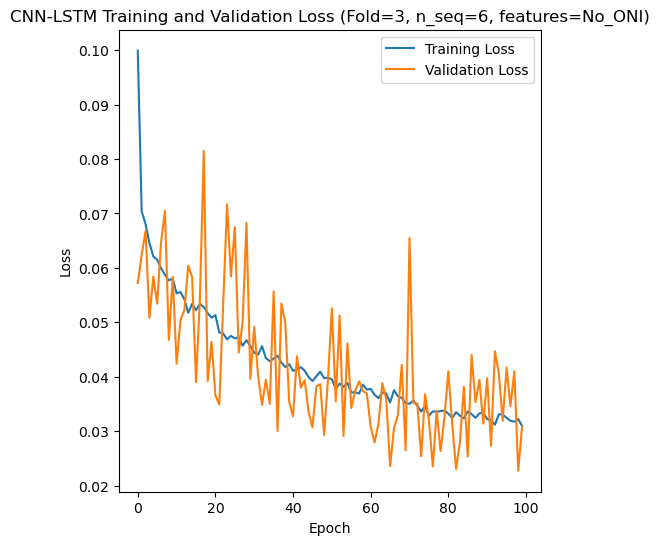

[[ 3.4   2.19  4.28 ... 10.54  6.41  5.39]
 [ 7.94  7.22  7.86 ... 18.27 13.85 11.85]
 [ 5.92  4.91  6.84 ... 14.38  9.59 10.48]
 ...
 [ 3.92  3.    4.93 ... 11.51  7.19  6.46]
 [ 3.98  2.61  4.   ... 10.23  6.65  5.8 ]
 [ 3.84  2.35  4.25 ... 10.6   6.5   5.9 ]]
Epoch 1/100
84/84 [==============================] - 42s 265ms/step - loss: 0.1012 - accuracy: 0.6667 - mae: 0.0878 - rmse: 0.1012 - mape: 14.7756 - pearson: 0.6296 - val_loss: 0.0615 - val_accuracy: 1.0000 - val_mae: 0.0440 - val_rmse: 0.0615 - val_mape: 7.1730 - val_pearson: 0.6697
Epoch 2/100
84/84 [==============================] - 14s 171ms/step - loss: 0.0709 - accuracy: 0.7262 - mae: 0.0577 - rmse: 0.0709 - mape: 9.7388 - pearson: 0.7132 - val_loss: 0.0644 - val_accuracy: 0.0000e+00 - val_mae: 0.0523 - val_rmse: 0.0644 - val_mape: 8.4939 - val_pearson: 0.6516
Epoch 3/100
84/84 [==============================] - 14s 171ms/step - loss: 0.0687 - accuracy: 0.7024 - mae: 0.0568 - rmse: 0.0687 - mape: 9.5894 - pearson: 0.7015

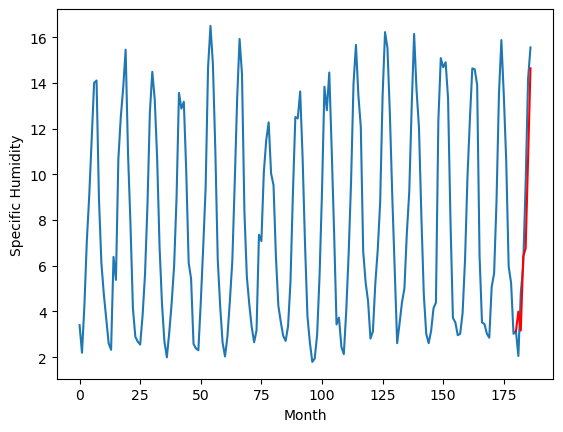

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.75		3.76		0.01
5.74		4.31		-1.43
5.71		6.18		0.47
6.46		6.19		-0.27
7.79		8.90		1.11
12.08		12.50		0.42
[180, 181, 182, 183, 184, 185, 186]
[7.79, 3.761059695482254, 4.30572389960289, 6.17649936079979, 6.18821140062064, 8.900051314942539, 12.499614675156772]


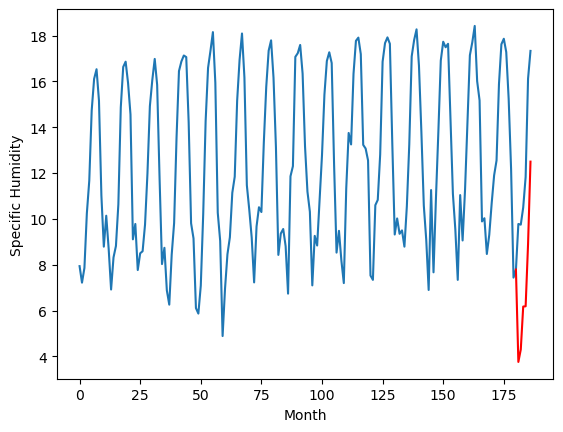

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.83		8.20		0.37
7.71		7.98		0.27
10.77		11.23		0.46
11.02		11.34		0.32
14.46		15.39		0.93
18.70		19.43		0.73
[180, 181, 182, 183, 184, 185, 186]
[5.03, 8.200285645723344, 7.980310963988305, 11.230880545973779, 11.337945851087571, 15.386456402540208, 19.43308440089226]


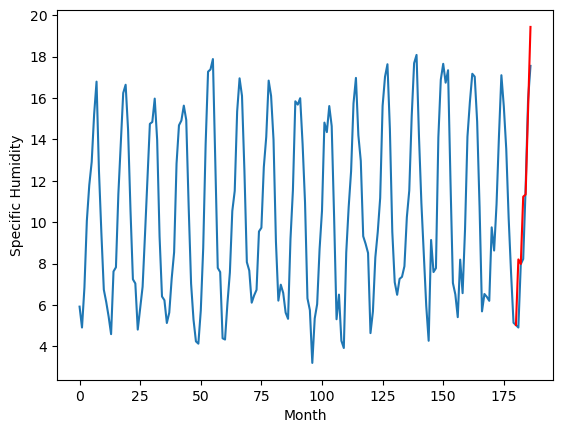

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.81		6.23		0.42
5.49		5.59		0.10
8.15		9.11		0.96
9.44		9.26		-0.18
13.44		13.64		0.20
17.13		17.39		0.26
[180, 181, 182, 183, 184, 185, 186]
[4.41, 6.231666518449783, 5.594302667379379, 9.11452080130577, 9.258842228055, 13.641533134579658, 17.38646173298359]


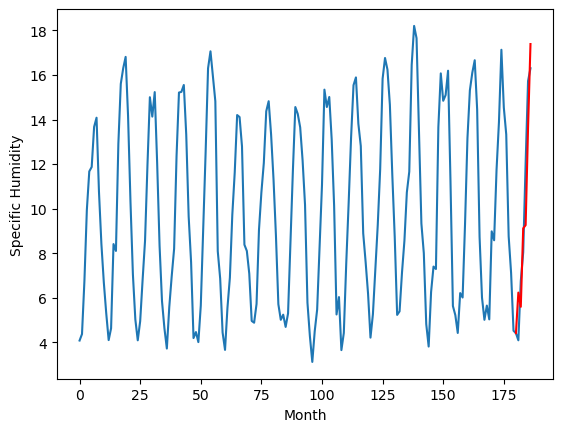

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.04		4.41		0.37
3.59		3.78		0.19
6.17		7.23		1.06
7.53		7.36		-0.17
11.82		11.69		-0.13
15.70		15.35		-0.35
[180, 181, 182, 183, 184, 185, 186]
[4.29, 4.408007161617279, 3.7827310729026795, 7.227380292415619, 7.363112779259682, 11.686354966759682, 15.348711104989052]


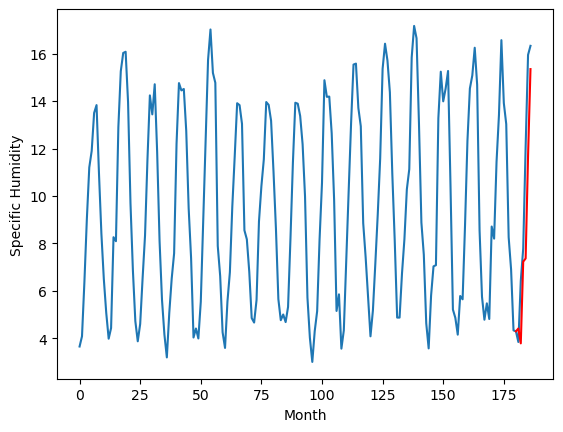

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.35		4.20		-0.15
3.71		3.87		0.16
5.20		6.51		1.31
6.16		6.44		0.28
10.71		10.12		-0.59
13.01		12.97		-0.04
[180, 181, 182, 183, 184, 185, 186]
[3.47, 4.202649855613709, 3.8692304432392124, 6.507368260622025, 6.435022489726544, 10.12128152102232, 12.97142709940672]


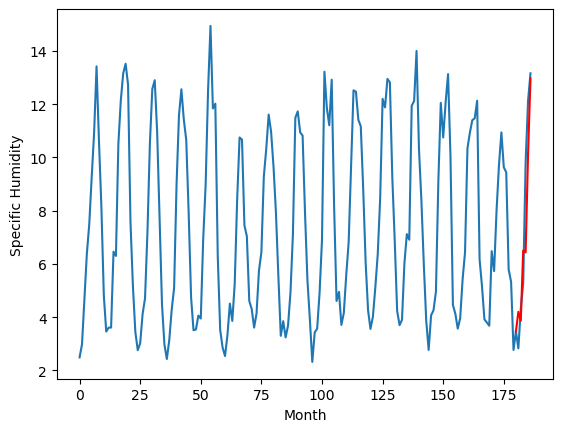

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.37		2.63		0.26
2.62		2.68		0.06
4.33		5.31		0.98
4.74		5.52		0.78
7.72		8.85		1.13
12.41		13.15		0.74
[180, 181, 182, 183, 184, 185, 186]
[4.52, 2.627872949242592, 2.679025077968836, 5.311339998394251, 5.5206005217134955, 8.848413431793452, 13.150509321838618]


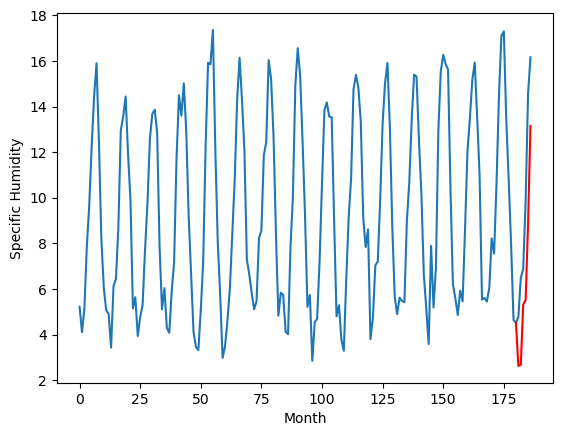

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.07		5.35		0.28
4.44		4.71		0.27
6.81		8.02		1.21
7.73		8.37		0.64
10.89		12.31		1.42
15.49		16.56		1.07
[180, 181, 182, 183, 184, 185, 186]
[3.4, 5.346136153936386, 4.709511877298355, 8.02497995018959, 8.366716475486754, 12.310069413185118, 16.562432618141173]


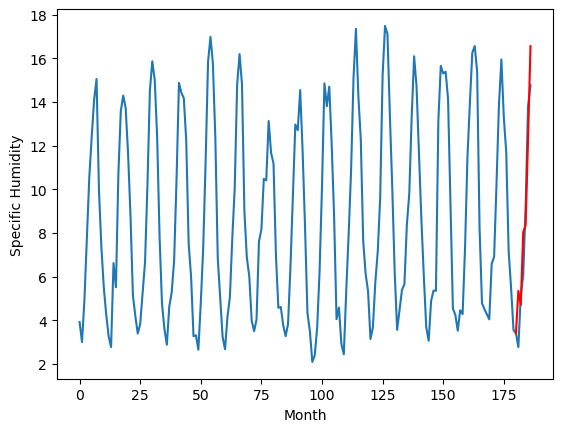

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.57		3.78		0.21
3.00		3.11		0.11
4.94		5.77		0.83
6.27		6.50		0.23
8.56		9.39		0.83
13.62		14.10		0.48
[180, 181, 182, 183, 184, 185, 186]
[2.82, 3.7804146540164947, 3.1051063072681426, 5.767742587327957, 6.504216386079788, 9.387556744813919, 14.100601865053177]


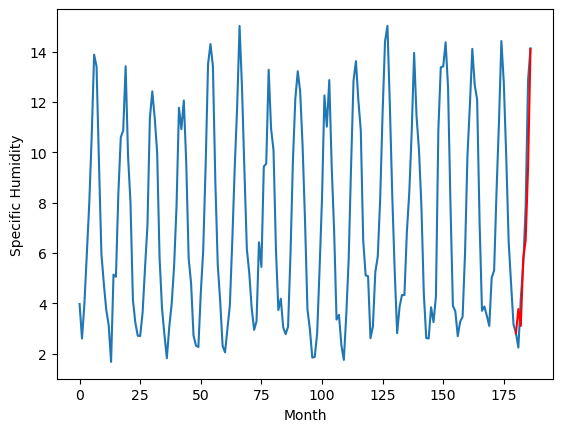

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.66		3.91		0.25
3.02		3.09		0.07
5.39		6.04		0.65
6.70		6.70		-0.00
9.32		9.95		0.63
14.07		14.53		0.46
[180, 181, 182, 183, 184, 185, 186]
[2.86, 3.911653343141079, 3.093924168050289, 6.040819052159787, 6.696393075883389, 9.951834264695645, 14.526808801591397]


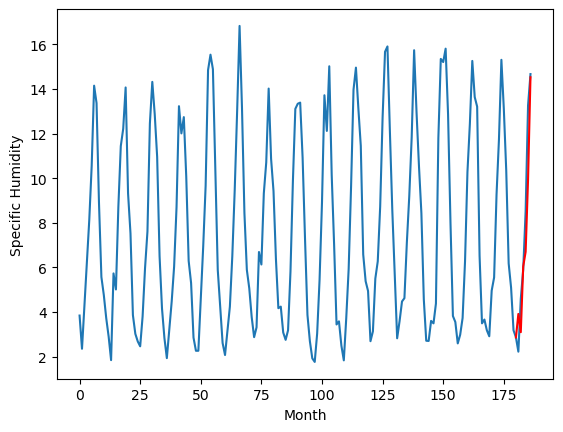

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.46		3.62		0.16
2.89		2.99		0.10
4.18		5.24		1.06
5.85		6.12		0.27
7.45		8.50		1.05
12.46		13.20		0.74
[180, 181, 182, 183, 184, 185, 186]
[2.61, 3.6214639061689375, 2.993028354048729, 5.244780969023704, 6.115352045893669, 8.49609435737133, 13.201967846751213]


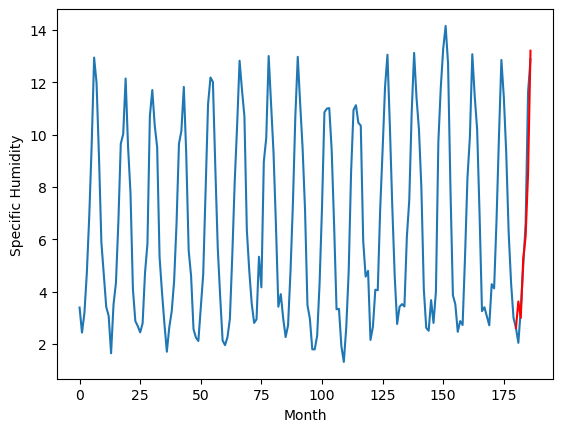

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    3.96   3.992138
1                 1    3.75   3.761060
2                 2    7.83   8.200286
3                 3    5.81   6.231667
4                 4    4.04   4.408007
5                 5    4.35   4.202650
6                 6    2.37   2.627873
7                 7    5.07   5.346136
8                 8    3.57   3.780415
9                 9    3.66   3.911653
10               10    3.46   3.621464


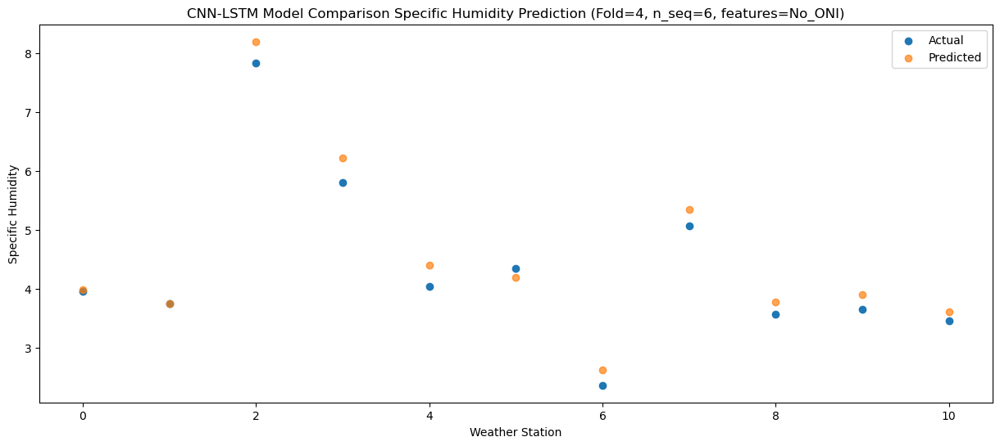

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    2.87   3.163411
1                 1    5.74   4.305724
2                 2    7.71   7.980311
3                 3    5.49   5.594303
4                 4    3.59   3.782731
5                 5    3.71   3.869230
6                 6    2.62   2.679025
7                 7    4.44   4.709512
8                 8    3.00   3.105106
9                 9    3.02   3.093924
10               10    2.89   2.993028


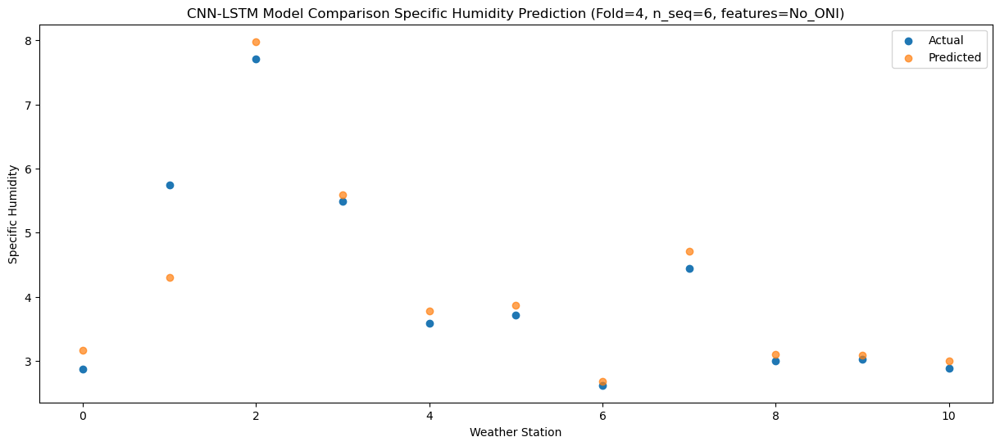

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    5.63   6.399628
1                 1    5.71   6.176499
2                 2   10.77  11.230881
3                 3    8.15   9.114521
4                 4    6.17   7.227380
5                 5    5.20   6.507368
6                 6    4.33   5.311340
7                 7    6.81   8.024980
8                 8    4.94   5.767743
9                 9    5.39   6.040819
10               10    4.18   5.244781


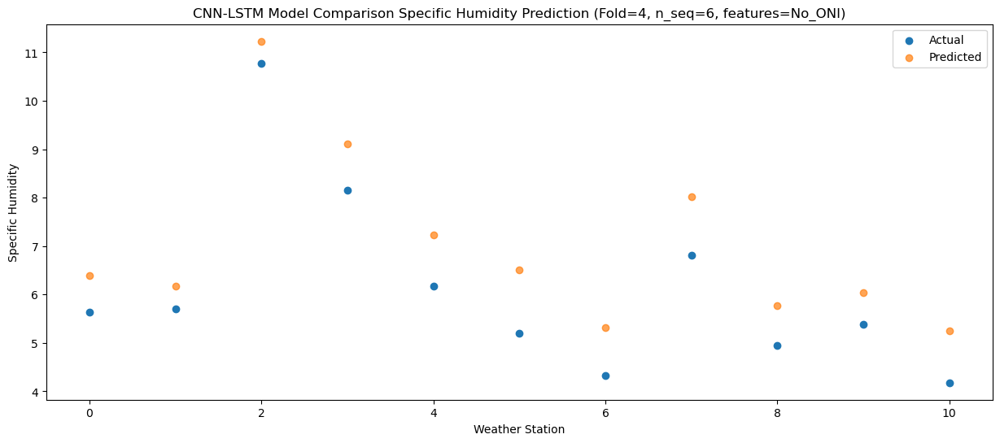

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    6.84   6.758754
1                 1    6.46   6.188211
2                 2   11.02  11.337946
3                 3    9.44   9.258842
4                 4    7.53   7.363113
5                 5    6.16   6.435022
6                 6    4.74   5.520601
7                 7    7.73   8.366716
8                 8    6.27   6.504216
9                 9    6.70   6.696393
10               10    5.85   6.115352


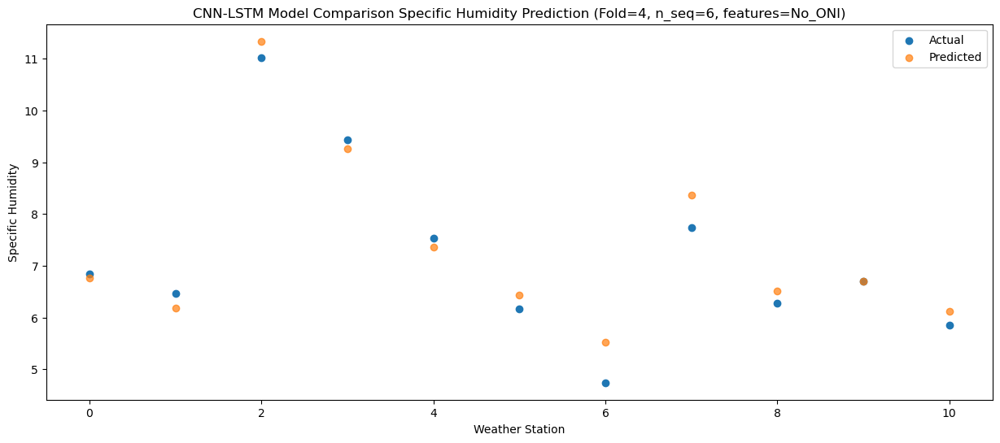

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.40  10.628417
1                 1    7.79   8.900051
2                 2   14.46  15.386456
3                 3   13.44  13.641533
4                 4   11.82  11.686355
5                 5   10.71  10.121282
6                 6    7.72   8.848413
7                 7   10.89  12.310069
8                 8    8.56   9.387557
9                 9    9.32   9.951834
10               10    7.45   8.496094


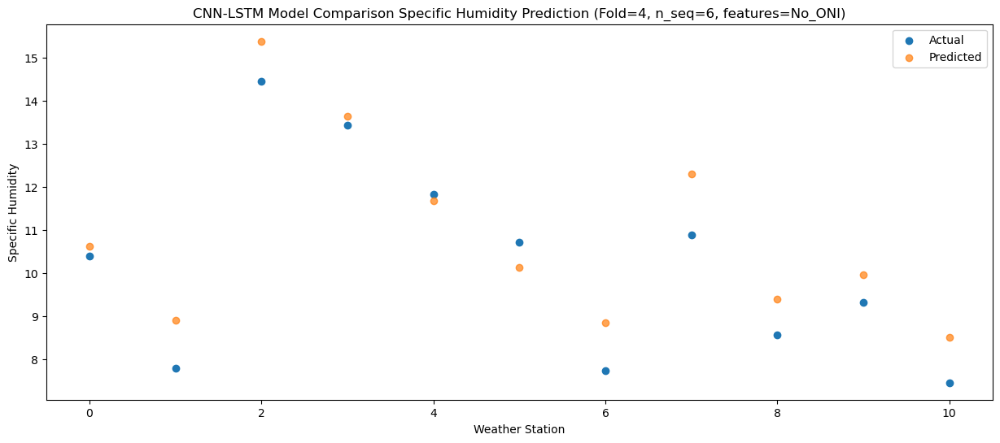

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   14.99  14.645666
1                 1   12.08  12.499615
2                 2   18.70  19.433084
3                 3   17.13  17.386462
4                 4   15.70  15.348711
5                 5   13.01  12.971427
6                 6   12.41  13.150509
7                 7   15.49  16.562433
8                 8   13.62  14.100602
9                 9   14.07  14.526809
10               10   12.46  13.201968


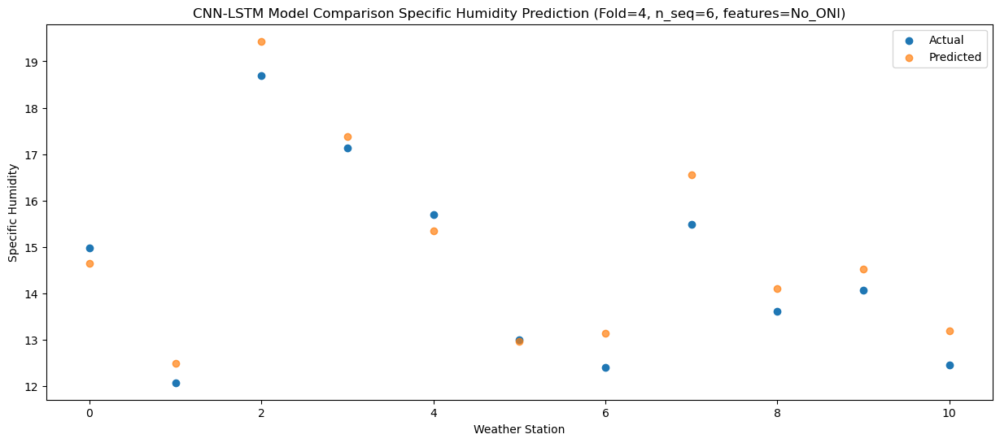

f, t:
[[ 3.96  3.75  7.83  5.81  4.04  4.35  2.37  5.07  3.57  3.66  3.46]
 [ 2.87  5.74  7.71  5.49  3.59  3.71  2.62  4.44  3.    3.02  2.89]
 [ 5.63  5.71 10.77  8.15  6.17  5.2   4.33  6.81  4.94  5.39  4.18]
 [ 6.84  6.46 11.02  9.44  7.53  6.16  4.74  7.73  6.27  6.7   5.85]
 [10.4   7.79 14.46 13.44 11.82 10.71  7.72 10.89  8.56  9.32  7.45]
 [14.99 12.08 18.7  17.13 15.7  13.01 12.41 15.49 13.62 14.07 12.46]]
[[ 3.99213791  3.7610597   8.20028565  6.23166652  4.40800716  4.20264986
   2.62787295  5.34613615  3.78041465  3.91165334  3.62146391]
 [ 3.1634106   4.3057239   7.98031096  5.59430267  3.78273107  3.86923044
   2.67902508  4.70951188  3.10510631  3.09392417  2.99302835]
 [ 6.39962834  6.17649936 11.23088055  9.1145208   7.22738029  6.50736826
   5.31134     8.02497995  5.76774259  6.04081905  5.24478097]
 [ 6.75875446  6.1882114  11.33794585  9.25884223  7.36311278  6.43502249
   5.52060052  8.36671648  6.50421639  6.69639308  6.11535205]
 [10.62841698  8.90005131 15.38

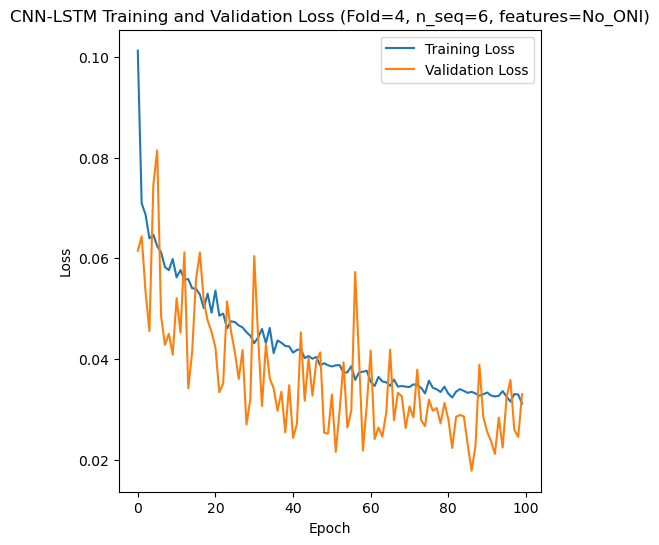

[[0.46130661987709876], [0.663236957233487], [1.3157918986277342], [0.5412908577283343], [0.6250999165330969]]
[[array(0.46130662)], [array(0.66323696)], [array(1.3157919)], [array(0.54129086)], [array(0.62509992)]]
[[0.34320350541761424], [0.5126729841304551], [0.9366217970464263], [0.4127595683125156], [0.4913917075408003]]
[[0.04092514061860318], [0.0705840637202392], [0.12979663697552432], [0.082196344460581], [0.0728621502044612]]
[[0.9868864055147224], [0.9741597082576363], [0.8859974568777031], [0.9744980549423768], [0.9763803586821186]]
[[array(0.04092514)], [array(0.07058406)], [array(0.12979664)], [array(0.08219634)], [array(0.07286215)]]
[[array(0.98907068)], [array(0.98178663)], [array(0.92887875)], [array(0.978536)], [array(0.98556247)]]
[ 3.9   3.41  6.58  6.97 10.12 14.93  5.74  6.45  8.66  8.88 11.37 16.12
  8.41  8.56 10.41 10.65 13.41 18.03  5.55  5.46  8.91  9.48 12.99 16.89
  7.36  6.96  9.8  11.2  15.21 18.9   4.02  4.61  6.18  7.19  9.69 14.95
  6.35  6.4   7.99  

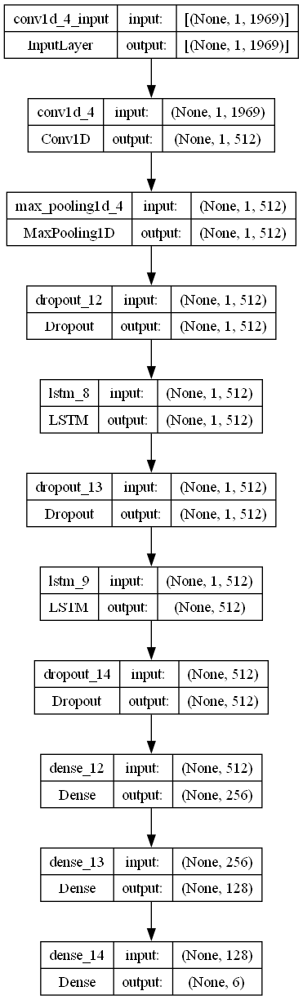

In [2]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def kmape (y_true, y_pred):
    return K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def kpearson (y_true, y_pred):
    mean_true = K.mean(y_true)
    mean_pred = K.mean(y_pred)
    return (K.square(K.mean((y_true - mean_true)*(y_pred - mean_pred))))/(K.mean(K.square(y_true - mean_true))*K.mean(K.square(y_pred - mean_pred)))

# fit the best CNN-LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from the best model
    filters = 512
    lr = 0.04808303496463368
    optimizer = SGD(learning_rate = lr)
    activation_function = 'tanh'
    lstm_units = 512
    dropout_rate = 0.29752279393568126

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# Make one forecast with a CNN-LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_cnnlstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_cnnlstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# Evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(actual, forecasts, n_lag, n_seq):

    t = np.array(actual).transpose()
    f = np.array(forecasts).transpose()

    print("f, t:")
    print(t)
    print(f)
    rmse_list = []
    mae_list = []
    skmape_list = []
    mape_list = []
    r2_list = []
    pearson_list = []
    actual_list = []

    for i in range(n_seq):
        act = [row for row in t[i]]
        predicted = [forecast for forecast in f[i]]
        rmse1 = sqrt(mean_squared_error(act, predicted))
        rmse2 = np.array(rmse(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        mae = mean_absolute_error(act, predicted)
        mse = mean_squared_error(act, predicted)
        skmape = mean_absolute_percentage_error(act, predicted)
        kmape1 = np.array(kmape(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        kpearson1 = np.array(kpearson(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        r2 = r2_score(act, predicted) 
        avg_actual = np.mean(act)
        print("Year at t+"+str(i+1)+":")
        print('t+%d SKRMSE: %f' % ((i+1), rmse1))
        print('t+%d KRMSE: %f' % ((i+1), rmse2))        
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d SKMAPE: %f' % ((i+1), skmape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))
        print('t+%d KMAPE: %f' % ((i+1), kmape1))
        print('t+%d PEARSON: %f' % ((i+1), kpearson1))
        print('t+%d AVERAGE ACTUAL: %f' % ((i+1), avg_actual))

    y_true = tf.convert_to_tensor(np.array(actual).flatten())
    y_pred = tf.convert_to_tensor(np.array(forecasts).flatten())

    rmse1 = sqrt(mean_squared_error(np.array(y_true), np.array(y_pred)))
    rmse2 = np.array(rmse(y_true, y_pred))
    mae = mean_absolute_error(np.array(y_true), np.array(y_pred))
    mse = mean_squared_error(np.array(y_true), np.array(y_pred))
    skmape = mean_absolute_percentage_error(np.array(y_true), np.array(y_pred))
    kmape1 = np.array(kmape(y_true, y_pred))
    kpearson1 = np.array(kpearson(y_true, y_pred))
    r2 = r2_score(np.array(y_true), np.array(y_pred)) 
    avg_actual = np.mean(np.array(y_true))
    rmse1_list.append(rmse1)
    rmse2_list.append(rmse2)
    mae_list.append(mae)
    skmape_list.append(skmape)
    pearson_list.append(kpearson1)
    mape_list.append(kmape1)
    r2_list.append(r2)
    actual_list.append(avg_actual)
    print("Metrics for this Fold:")
    print('SKRMSE: %f' % (rmse1))
    print('KRMSE: %f' % (rmse2))        
    print('MAE: %f' % (mae))
    print('SKMAPE: %f' % (skmape))
    print('R2_SCORE: %f' % (r2))
    print('KMAPE: %f' % (kmape1))
    print('PEARSON: %f' % (kpearson1))
    print('AVERAGE ACTUAL: %f' % (avg_actual))

    return rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, actual, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Specific Humidity")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse1_avg_list = []
rmse2_avg_list = []
mae_avg_list = []
skmape_avg_list = []
r2_score_avg_list = []
mape_avg_list = []
pearson_avg_list = []
actual_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]
    
    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    print(dataset)

    series = pd.Series(dataset[:, 0]) # Using first column (specific_humidity)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))
    
    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test, n_seq)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    print(results_df)
    
    print("Actual and Forecasts:")
    print(actual)
    print(forecasts)
    
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual S.H.\tPredicted S.H.\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        actual_ws = actual[j]
        
        plot_forecasts(series_ws, forecasts_ws, actual_ws, n_test, n_seq, n_lag)

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)

        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='CNN-LSTM Model Comparison Specific Humidity Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_ONI)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Specific Humidity')
        plt.legend()
        plt.show()

    rmse1_list = [] # list stores sklearn's root mean squared errors for each future time prediction
    rmse2_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores mean absolute errors for each future time prediction
    skmape_list = [] # list stores sklearn's mean squared percentage errors for each future time prediction
    r2_list = [] # list stores sklearn's r2 pearson values for each future time prediction
    mape_list = [] # list stores mean squared percentage errors for each future time prediction
    pearson_list = [] # list stores r2 pearson values for each future time prediction
    actual_list = [] # list stores average actual values for each future time prediction

    # evaluate forecasts
    rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse1_avg_list.append(rmse1_list)
    rmse2_avg_list.append(rmse2_list)
    mae_avg_list.append(mae_list)
    skmape_avg_list.append(skmape_list)
    r2_score_avg_list.append(r2_list)
    mape_avg_list.append(mape_list)
    pearson_avg_list.append(pearson_list)
    actual_avg_list.append(actual_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)
            
    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'CNN-LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_ONI)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse1_avg_list)
print(rmse2_avg_list)
print(mae_avg_list)
print(skmape_avg_list)
print(r2_score_avg_list)
print(mape_avg_list)
print(pearson_avg_list)
print(np.array(actual_results).flatten())
print(np.array(forecast_results).flatten())
a2 = np.array(actual_results).flatten()
f2 = np.array(forecast_results).flatten()
p1 = np.array(pearson(tf.convert_to_tensor(a2), tf.convert_to_tensor(f2)))
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse1_avg_list)
print("Average SKRMSE:"+str(np.mean(rmse1_avg_list)))
print("Average KRMSE:"+str(np.mean(rmse2_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average SKMAPE:"+str(np.mean(skmape_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average PEARSON:"+str(p1))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))
print("")
print("Average Specific Humidity:"+str(np.mean(actual_avg_list)))
print("RMSE % of Specific Humidity:"+str(np.mean(rmse2_avg_list)/np.mean(actual_avg_list)))

# Plot model architecture
filename = "cnnlstm_model_optimized_SH_S6_No_ONI.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)